In [6]:
Belgium_map_url = 'https://github.com/mariobecerra/mda_project/blob/main/data/arrondissements_shape.shp'

!conda env list

# conda environments:
#
base                  *  C:\Users\baris\Anaconda3
COMP341                  C:\Users\baris\Anaconda3\envs\COMP341
mda                      C:\Users\baris\Anaconda3\envs\mda
sparknlp                 C:\Users\baris\Anaconda3\envs\sparknlp



In [5]:
import os
os.getcwd()
os.chdir("C:\\Users\\baris\\Desktop\\Modern Data Analytics\\mda_project")

install geopandas pacjake to read dor reading the shapefile

In [ ]:
!pip install geopandas

In [172]:
import geopandas as gpd


In [93]:
Belgium_map = gpd.GeoDataFrame.from_file('./data/arrondissements_shape.shp') #it worked for me only if I upload the files to the session manually, but not if indicate the path in the folder. 
#All four files (.dbf, .ptj, .shp, .shx) should be in the same folder, otherwise there are errors with reading the shapefile.


ModuleNotFoundError: No module named 'geojson'

In [10]:
Belgium_map.head()


,Shape_Leng,Shape_Area,INS,LANG,Name1,Name2,geometry
0,169989.192808,1.003844e+09,11000,NN,Antwerpen,None,"POLYGON ((662106.376 740967.580, 662162.309 74..."
1,150947.175998,5.119499e+08,12000,NN,Mechelen,None,"POLYGON ((671311.591 707603.770, 671353.400 70..."
2,228401.102863,1.359241e+09,13000,NN,Turnhout,None,"MULTIPOLYGON (((688864.783 736887.001, 688888...."
3,62133.678433,1.625668e+08,21000,FN,Bruxelles,Brussel,"POLYGON ((653270.158 677320.255, 653291.392 67..."
4,281254.375729,9.488673e+08,23000,NN,Halle-Vilvoorde,None,"POLYGON ((643772.195 692449.425, 643815.652 69..."


Plot the shapefile

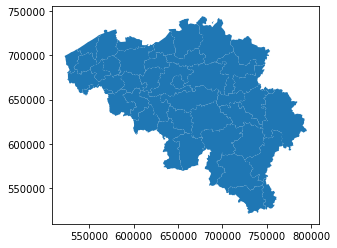

In [23]:
Belgium_map.plot()

Read the frequency file

In [12]:
import pandas as pd
heat_fr = pd.read_csv('./data/hw_freq_df.csv' )


In [29]:
heat_fr.head()

,arron,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2000-2009,2010-2019,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
0,41000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
1,11000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
2,81000,3,0,2,0,2,0,4,0,1,...,1.6,2.0,1.4,1.0,1.2,2.0,2.2,1.0,2.0,2.0
3,51000,1,0,0,0,2,0,4,0,1,...,1.5,1.1,0.6,1.0,0.8,2.6,2.0,1.0,1.0,1.2
4,45000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4


Keep only the necessary columns of a shapefile - geometry and code of arrondissement

In [109]:
Belgium_shapes = Belgium_map[['geometry', 'INS','Name1']]
Belgium_shapes.head()
 



,geometry,INS,Name1
0,"POLYGON ((662106.376 740967.580, 662162.309 74...",11000,Antwerpen
1,"POLYGON ((671311.591 707603.770, 671353.400 70...",12000,Mechelen
2,"MULTIPOLYGON (((688864.783 736887.001, 688888....",13000,Turnhout
3,"POLYGON ((653270.158 677320.255, 653291.392 67...",21000,Bruxelles
4,"POLYGON ((643772.195 692449.425, 643815.652 69...",23000,Halle-Vilvoorde


Add mean heat wave frequncies over decades to the file with frequencies

---



In [31]:
years_80_89 = heat_fr.loc[: , "1980":"1989"]
years_90_99 = heat_fr.loc[: , "1990":"1999"]
years_00_09 = heat_fr.loc[: , "2000":"2009"]
years_10_19 = heat_fr.loc[: , "2010":"2019"]
heat_fr['1980-1989'] = years_80_89.mean(axis=1)
heat_fr['1990-1999'] = years_90_99.mean(axis=1)
heat_fr['2000-2009'] = years_00_09.mean(axis=1)
heat_fr['2010-2019'] = years_10_19.mean(axis=1)
heat_fr.head(5)


,arron,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2000-2009,2010-2019,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
0,41000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
1,11000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
2,81000,3,0,2,0,2,0,4,0,1,...,1.6,2.0,1.4,1.0,1.2,2.0,2.2,1.0,2.0,2.0
3,51000,1,0,0,0,2,0,4,0,1,...,1.5,1.1,0.6,1.0,0.8,2.6,2.0,1.0,1.0,1.2
4,45000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4


Add frequencies for each 5 years to the same file

In [32]:
years_80_84 = heat_fr.loc[: , "1980":"1984"]
years_85_89 = heat_fr.loc[: , "1985":"1989"]
years_90_94 = heat_fr.loc[: , "1990":"1994"]
years_95_99 = heat_fr.loc[: , "1995":"1999"]
years_00_04 = heat_fr.loc[: , "2000":"2004"]
years_05_09 = heat_fr.loc[: , "2005":"2009"]
years_10_14 = heat_fr.loc[: , "2010":"2014"]
years_15_19 = heat_fr.loc[: , "2015":"2019"]
heat_fr['1980-1984'] = years_80_84.mean(axis=1)
heat_fr['1985-1989'] = years_85_89.mean(axis=1)
heat_fr['1990-1994'] = years_90_94.mean(axis=1)
heat_fr['1995-1999'] = years_95_99.mean(axis=1)
heat_fr['2000-2004'] = years_00_04.mean(axis=1)
heat_fr['2005-2009'] = years_05_09.mean(axis=1)
heat_fr['2010-2014'] = years_10_14.mean(axis=1)
heat_fr['2015-2019'] = years_15_19.mean(axis=1)
heat_fr.head(5)


,arron,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2000-2009,2010-2019,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
0,41000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
1,11000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
2,81000,3,0,2,0,2,0,4,0,1,...,1.6,2.0,1.4,1.0,1.2,2.0,2.2,1.0,2.0,2.0
3,51000,1,0,0,0,2,0,4,0,1,...,1.5,1.1,0.6,1.0,0.8,2.6,2.0,1.0,1.0,1.2
4,45000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4


Prepare the data for joining shapefile and heat frequency data. Rename the column in the shapefile

In [110]:
Belgium_shapes = Belgium_shapes.rename(columns ={'INS':'arron'})


In [111]:
Belgium_shapes.head() 

,geometry,arron,Name1
0,"POLYGON ((662106.376 740967.580, 662162.309 74...",11000,Antwerpen
1,"POLYGON ((671311.591 707603.770, 671353.400 70...",12000,Mechelen
2,"MULTIPOLYGON (((688864.783 736887.001, 688888....",13000,Turnhout
3,"POLYGON ((653270.158 677320.255, 653291.392 67...",21000,Bruxelles
4,"POLYGON ((643772.195 692449.425, 643815.652 69...",23000,Halle-Vilvoorde


Merge shapefile and heat wave frequency

In [112]:
Belgium_shapes_merge = Belgium_shapes.merge(heat_fr, on='arron', suffixes=('', '_drop'))



In [113]:
Belgium_shapes_merge.head() 

,geometry,arron,Name1,1980,1981,1982,1983,1984,1985,1986,...,2000-2009,2010-2019,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
0,"POLYGON ((662106.376 740967.580, 662162.309 74...",11000,Antwerpen,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
1,"POLYGON ((671311.591 707603.770, 671353.400 70...",12000,Mechelen,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
2,"MULTIPOLYGON (((688864.783 736887.001, 688888....",13000,Turnhout,3,0,2,0,2,0,4,...,1.4,1.4,1.4,1.0,0.8,2.2,1.8,1.0,1.2,1.6
3,"POLYGON ((653270.158 677320.255, 653291.392 67...",21000,Bruxelles,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
4,"POLYGON ((643772.195 692449.425, 643815.652 69...",23000,Halle-Vilvoorde,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4


Plot the heat frequency for one year

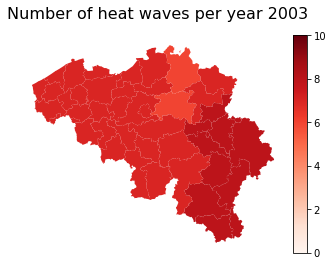

In [114]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(1, 1)

divider = make_axes_locatable(ax)
ax.set_axis_off()
fig.suptitle('Number of heat waves per year 2003', fontsize=16)
cax = divider.append_axes("right", size="5%", pad=0.1)
vmin, vmax = 0, 10
Belgium_shapes_merge.plot(column='2003', cmap='Reds', ax=ax, legend=True, cax=cax, vmin=vmin, vmax=vmax)

Plot the average heatwave frequencies per decade

Text(0.5, 1, '2010-2019')

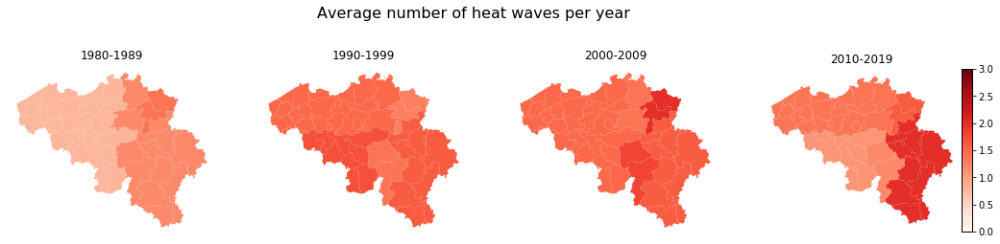

In [38]:
fig, (ax1,ax2,ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(18, 6))
divider = make_axes_locatable(ax4)
fig.suptitle('Average number of heat waves per year', fontsize=16, y=0.85)
ax1.set_axis_off()
ax2.set_axis_off()
ax3.set_axis_off()
ax4.set_axis_off()

cax = divider.append_axes("right", size="5%", pad=0)

vmin, vmax = 0, 3
ax1 = Belgium_shapes_merge.plot(ax=ax1, column='1980-1989', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax2 = Belgium_shapes_merge.plot(ax=ax2, column='1990-1999', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax3 = Belgium_shapes_merge.plot(ax=ax3, column='2000-2009', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax4 = Belgium_shapes_merge.plot(ax=ax4, column='2010-2019', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax1.set_title("1980-1989")
ax2.set_title("1990-1999")
ax3.set_title("2000-2009")
ax4.set_title("2010-2019")


Plot average heat wave frequencies at 5 year interval

Text(0.5, 1, '2015-2019')

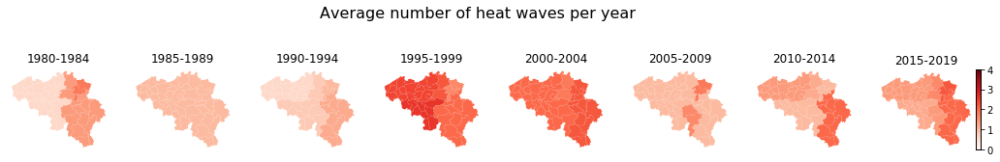

In [39]:
fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8) = plt.subplots(nrows=1, ncols=8, figsize=(18, 6))
divider = make_axes_locatable(ax8)
fig.suptitle('Average number of heat waves per year', fontsize=16, y=0.75)
ax1.set_axis_off()
ax2.set_axis_off()
ax3.set_axis_off()
ax4.set_axis_off()
ax5.set_axis_off()
ax6.set_axis_off()
ax7.set_axis_off()
ax8.set_axis_off()
cax = divider.append_axes("right", size="5%", pad=0)
vmin, vmax = 0, 4
ax1 = Belgium_shapes_merge.plot(ax=ax1, column='1980-1984', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax2 = Belgium_shapes_merge.plot(ax=ax2, column='1985-1989', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax3 = Belgium_shapes_merge.plot(ax=ax3, column='1990-1994', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax4 = Belgium_shapes_merge.plot(ax=ax4, column='1995-1999', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax5 = Belgium_shapes_merge.plot(ax=ax5, column='2000-2004', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax6 = Belgium_shapes_merge.plot(ax=ax6, column='2005-2009', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax7 = Belgium_shapes_merge.plot(ax=ax7, column='2010-2014', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax8 = Belgium_shapes_merge.plot(ax=ax8, column='2015-2019', cmap='Reds', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax1.set_title("1980-1984")
ax2.set_title("1985-1989")
ax3.set_title("1990-1994")
ax4.set_title("1995-1999")
ax5.set_title("2000-2004")
ax6.set_title("2005-2009")
ax7.set_title("2010-2014")
ax8.set_title("2015-2019")

Explore trends in heat intensities
(average T above the local threshols during heat waves (°C)) 

In [40]:
heat_intens = pd.read_csv('./data/hw_int_df.csv' )

In [205]:
heat_intens.head()

,arron,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,1980-1989,1990-1999,2000-2009,2010-2019
0,41000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,0.476,1.293000,1.072857,0.889,1.962333,1.212,0.987500,0.884500,0.980929,1.587167
1,11000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,0.476,1.293000,1.072857,0.889,1.962333,1.212,0.987500,0.884500,0.980929,1.587167
2,81000,0.841667,0,1.15,0,1.025,0,1.72,0,2.0,...,0.560,1.205000,1.264000,0.720,1.185714,1.863,0.673667,0.882500,0.992000,1.524357
3,51000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,0.642,1.397333,1.325143,0.838,1.136667,1.287,0.987500,1.019667,1.081571,1.211833
4,45000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,0.476,1.293000,1.072857,0.889,1.962333,1.212,0.987500,0.884500,0.980929,1.587167


Calculate mean intensity for 5 year intervals

In [42]:
years_80_84 = heat_intens.loc[: , "1980":"1984"]
years_85_89 = heat_intens.loc[: , "1985":"1989"]
years_90_94 = heat_intens.loc[: , "1990":"1994"]
years_95_99 = heat_intens.loc[: , "1995":"1999"]
years_00_04 = heat_intens.loc[: , "2000":"2004"]
years_05_09 = heat_intens.loc[: , "2005":"2009"]
years_10_14 = heat_intens.loc[: , "2010":"2014"]
years_15_19 = heat_intens.loc[: , "2015":"2019"]
heat_intens['1980-1984'] = years_80_84.mean(axis=1)
heat_intens['1985-1989'] = years_85_89.mean(axis=1)
heat_intens['1990-1994'] = years_90_94.mean(axis=1)
heat_intens['1995-1999'] = years_95_99.mean(axis=1)
heat_intens['2000-2004'] = years_00_04.mean(axis=1)
heat_intens['2005-2009'] = years_05_09.mean(axis=1)
heat_intens['2010-2014'] = years_10_14.mean(axis=1)
heat_intens['2015-2019'] = years_15_19.mean(axis=1)
heat_intens.head(5)

,arron,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
0,41000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,1.40,4.010,1.045000,0.930,0.476,1.293000,1.072857,0.889,1.962333,1.212
1,11000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,1.40,4.010,1.045000,0.930,0.476,1.293000,1.072857,0.889,1.962333,1.212
2,81000,0.841667,0,1.15,0,1.025,0,1.72,0,2.0,...,1.17,3.845,0.603333,0.744,0.560,1.205000,1.264000,0.720,1.185714,1.863
3,51000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,1.80,4.285,1.045000,0.930,0.642,1.397333,1.325143,0.838,1.136667,1.287
4,45000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,1.40,4.010,1.045000,0.930,0.476,1.293000,1.072857,0.889,1.962333,1.212


Add average intensity per decade

In [43]:
years_80_89 = heat_intens.loc[: , "1980":"1989"]
years_90_99 = heat_intens.loc[: , "1990":"1999"]
years_00_09 = heat_intens.loc[: , "2000":"2009"]
years_10_19 = heat_intens.loc[: , "2010":"2019"]
heat_intens['1980-1989'] = years_80_89.mean(axis=1)
heat_intens['1990-1999'] = years_90_99.mean(axis=1)
heat_intens['2000-2009'] = years_00_09.mean(axis=1)
heat_intens['2010-2019'] = years_10_19.mean(axis=1)
heat_intens.head(5)

,arron,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,1980-1989,1990-1999,2000-2009,2010-2019
0,41000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,0.476,1.293000,1.072857,0.889,1.962333,1.212,0.987500,0.884500,0.980929,1.587167
1,11000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,0.476,1.293000,1.072857,0.889,1.962333,1.212,0.987500,0.884500,0.980929,1.587167
2,81000,0.841667,0,1.15,0,1.025,0,1.72,0,2.0,...,0.560,1.205000,1.264000,0.720,1.185714,1.863,0.673667,0.882500,0.992000,1.524357
3,51000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,0.642,1.397333,1.325143,0.838,1.136667,1.287,0.987500,1.019667,1.081571,1.211833
4,45000,3.875000,0,0.00,0,1.350,0,2.25,0,2.4,...,0.476,1.293000,1.072857,0.889,1.962333,1.212,0.987500,0.884500,0.980929,1.587167


Merge shapefile and intensity data

In [206]:
Belgium_shapes_intens = Belgium_shapes.merge(heat_intens, on='arron', suffixes=('', '_drop'))
Belgium_shapes_intens.head()

,geometry,arron,Name1,1980,1981,1982,1983,1984,1985,1986,...,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,1980-1989,1990-1999,2000-2009,2010-2019
0,"POLYGON ((662106.376 740967.580, 662162.309 74...",11000,Antwerpen,3.875,0,0.00,0,1.35,0,2.250,...,0.476,1.293,1.072857,0.889000,1.962333,1.212,0.9875,0.8845,0.980929,1.587167
1,"POLYGON ((671311.591 707603.770, 671353.400 70...",12000,Mechelen,3.875,0,0.00,0,1.35,0,2.250,...,0.476,1.293,1.072857,0.889000,1.962333,1.212,0.9875,0.8845,0.980929,1.587167
2,"MULTIPOLYGON (((688864.783 736887.001, 688888....",13000,Turnhout,2.675,0,0.65,0,1.55,0,2.245,...,0.644,1.322,1.199333,1.022333,0.805000,1.912,0.9245,0.9830,1.110833,1.358500
3,"POLYGON ((653270.158 677320.255, 653291.392 67...",21000,Bruxelles,3.875,0,0.00,0,1.35,0,2.250,...,0.476,1.293,1.072857,0.889000,1.962333,1.212,0.9875,0.8845,0.980929,1.587167
4,"POLYGON ((643772.195 692449.425, 643815.652 69...",23000,Halle-Vilvoorde,3.875,0,0.00,0,1.35,0,2.250,...,0.476,1.293,1.072857,0.889000,1.962333,1.212,0.9875,0.8845,0.980929,1.587167


Plot the heat intensity per decade

Text(0.5, 1, '2010-2019')

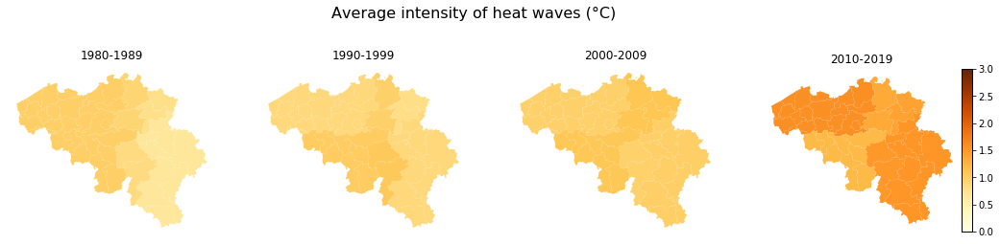

In [45]:
fig, (ax1,ax2,ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(18, 6))
divider = make_axes_locatable(ax4)
fig.suptitle('Average intensity of heat waves (°C)', fontsize=16, y=0.85)
ax1.set_axis_off()
ax2.set_axis_off()
ax3.set_axis_off()
ax4.set_axis_off()
cax = divider.append_axes("right", size="5%", pad=0)
vmin, vmax = 0, 3
ax1 = Belgium_shapes_intens.plot(ax=ax1, column='1980-1989', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax2 = Belgium_shapes_intens.plot(ax=ax2, column='1990-1999', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax3 = Belgium_shapes_intens.plot(ax=ax3, column='2000-2009', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax4 = Belgium_shapes_intens.plot(ax=ax4, column='2010-2019', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax1.set_title("1980-1989")
ax2.set_title("1990-1999")
ax3.set_title("2000-2009")
ax4.set_title("2010-2019")

Plot the heat intensity (average T above the local threshols during heat waves (°C)) per 5 year period

Text(0.5, 1, '2015-2019')

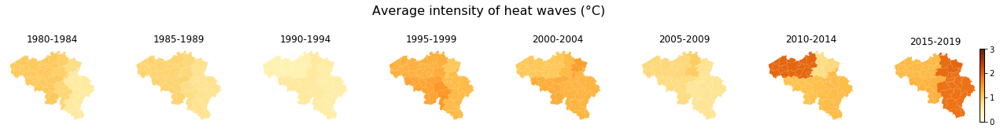

In [46]:
fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8) = plt.subplots(nrows=1, ncols=8, figsize=(18, 6))
divider = make_axes_locatable(ax8)
fig.suptitle('Average intensity of heat waves (°C)', fontsize=16, y=0.75)
fig.tight_layout()
ax1.set_axis_off()
ax2.set_axis_off()
ax3.set_axis_off()
ax4.set_axis_off()
ax5.set_axis_off()
ax6.set_axis_off()
ax7.set_axis_off()
ax8.set_axis_off()

cax = divider.append_axes("right", size="5%", pad=0)

vmin, vmax = 0, 3
ax1 = Belgium_shapes_intens.plot(ax=ax1, column='1980-1984', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax2 = Belgium_shapes_intens.plot(ax=ax2, column='1985-1989', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax3 = Belgium_shapes_intens.plot(ax=ax3, column='1990-1994', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax4 = Belgium_shapes_intens.plot(ax=ax4, column='1995-1999', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax5 = Belgium_shapes_intens.plot(ax=ax5, column='2000-2004', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax6 = Belgium_shapes_intens.plot(ax=ax6, column='2005-2009', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax7 = Belgium_shapes_intens.plot(ax=ax7, column='2010-2014', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax8 = Belgium_shapes_intens.plot(ax=ax8, column='2015-2019', cmap='YlOrBr', legend=True, cax=cax, vmin=vmin, vmax=vmax)
ax1.set_title("1980-1984")
ax2.set_title("1985-1989")
ax3.set_title("1990-1994")
ax4.set_title("1995-1999")
ax5.set_title("2000-2004")
ax6.set_title("2005-2009")
ax7.set_title("2010-2014")
ax8.set_title("2015-2019")

Brussels (potential heat island, NIS code 21000) and Halle-Vilvoorde (surrounding area, NIS code 23000) have the same data for some reason. So Brussels and Leuven (next closest arrondisement. NIS code 24000) are taken for checking is there a heat island effect.

In [47]:
heat_fr.head()

,arron,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2000-2009,2010-2019,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
0,41000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
1,11000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
2,81000,3,0,2,0,2,0,4,0,1,...,1.6,2.0,1.4,1.0,1.2,2.0,2.2,1.0,2.0,2.0
3,51000,1,0,0,0,2,0,4,0,1,...,1.5,1.1,0.6,1.0,0.8,2.6,2.0,1.0,1.0,1.2
4,45000,1,0,0,0,2,0,4,0,1,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4


Create a dataframe for heat wave frequency plot

In [48]:
Brussels=heat_fr.loc[7].values.tolist()
del Brussels[0]
del Brussels[41:54]
print(Brussels)
Leuven=heat_fr.loc[19].values.tolist()
del Leuven[0]
del Leuven[41:54]
print(Leuven)



[1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 4.0, 5.0, 2.0, 0.0, 1.0, 2.0, 7.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 3.0, 0.0, 1.0, 3.0, 0.0, 1.0, 1.0, 1.0, 1.0, 3.0, 5.0]
[3.0, 0.0, 2.0, 0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 2.0, 0.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 1.0, 2.0, 6.0, 0.0, 0.0, 3.0, 0.0, 1.0, 1.0, 5.0, 0.0, 1.0, 0.0, 0.0, 2.0, 1.0, 1.0, 2.0, 2.0, 5.0]


In [49]:
years=list(heat_fr.columns.values)
del years[42:54]
del years[0]
print(years)

['1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020']


In [50]:
hw_freq_Bru = pd.DataFrame()
hw_freq_Bru['Surroundings'] = Leuven
hw_freq_Bru['Brussels'] = Brussels
hw_freq_Bru.index=years
hw_freq_Bru.head()

,Surroundings,Brussels
1980,3.0,1.0
1981,0.0,0.0
1982,2.0,0.0
1983,0.0,0.0
1984,2.0,2.0


Plot the heat frequncies in Brussels and surroundings

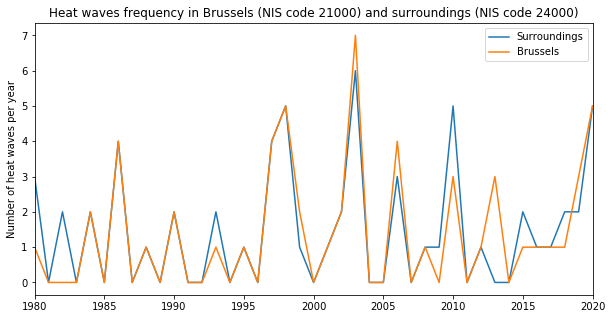

In [51]:
fig, ax = plt.subplots(1, 1)
ax.set(title = "Heat waves frequency in Brussels (NIS code 21000) and surroundings (NIS code 24000)", 
       ylabel = "Number of heat waves per year")
hw_freq_Bru.plot(ax=ax, figsize=(10,5), legend= "True")


In [52]:
heat_intens

,arron,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,1980-1989,1990-1999,2000-2009,2010-2019
0,41000,3.875000,0,0.000000,0,1.350,0,2.250,0,2.400,...,0.476,1.293000,1.072857,0.889000,1.962333,1.212,0.987500,0.884500,0.980929,1.587167
1,11000,3.875000,0,0.000000,0,1.350,0,2.250,0,2.400,...,0.476,1.293000,1.072857,0.889000,1.962333,1.212,0.987500,0.884500,0.980929,1.587167
2,81000,0.841667,0,1.150000,0,1.025,0,1.720,0,2.000,...,0.560,1.205000,1.264000,0.720000,1.185714,1.863,0.673667,0.882500,0.992000,1.524357
3,51000,3.875000,0,0.000000,0,1.350,0,2.250,0,2.400,...,0.642,1.397333,1.325143,0.838000,1.136667,1.287,0.987500,1.019667,1.081571,1.211833
4,45000,3.875000,0,0.000000,0,1.350,0,2.250,0,2.400,...,0.476,1.293000,1.072857,0.889000,1.962333,1.212,0.987500,0.884500,0.980929,1.587167
5,82000,0.841667,0,1.150000,0,1.025,0,1.720,0,2.000,...,0.560,1.205000,1.264000,0.720000,1.185714,1.863,0.673667,0.882500,0.992000,1.524357
6,31000,3.875000,0,0.000000,0,1.350,0,2.250,0,2.400,...,0.476,1.293000,1.072857,0.889000,1.962333,1.212,0.987500,0.884500,0.980929,1.587167
7,21000,3.875000,0,0.000000,0,1.350,0,2.250,0,2.400,...,0.476,1.293000,1.072857,0.889000,1.962333,1.212,0.987500,0.884500,0.980929,1.587167
8,52000,3.875000,0,0.000000,0,1.350,0,2.250,0,2.400,...,0.642,1.397333,1.325143,0.838000,1.136667,1.287,0.987500,1.019667,1.081571,1.211833
9,34000,3.875000,0,0.000000,0,1.350,0,2.250,0,2.400,...,0.476,1.293000,1.072857,0.889000,1.962333,1.212,0.987500,0.884500,0.980929,1.587167


Create a dataframe for heat intensity plot

In [53]:
Brussels_int=heat_intens.loc[7].values.tolist()
del Brussels_int[0]
del Brussels_int[41:54]
print(Brussels_int)
Leuven_int=heat_intens.loc[19].values.tolist()
del Leuven_int[0]
del Leuven_int[41:54]
print(Leuven_int)

[3.875, 0.0, 0.0, 0.0, 1.3499999999999996, 0.0, 2.2499999999999982, 0.0, 2.400000000000002, 0.0, 2.1599999999999966, 0.0, 0.0, 0.2200000000000024, 0.0, 1.0199999999999996, 0.0, 1.7950000000000008, 2.660000000000001, 0.9900000000000021, 0.0, 0.8999999999999949, 2.1499999999999986, 2.3142857142857154, 0.0, 0.0, 2.1950000000000003, 0.0, 2.25, 0.0, 1.8599999999999932, 0.0, 2.8249999999999997, 5.126666666666663, 0.0, 0.6400000000000006, 2.1000000000000014, 0.6000000000000014, 1.3200000000000005, 1.3999999999999997, 4.01]
[2.6750000000000007, 0.0, 0.6500000000000021, 0.0, 1.5500000000000007, 0.0, 2.2449999999999983, 0.0, 2.125, 0.0, 2.159999999999993, 0.0, 0.0, 1.0599999999999952, 0.0, 0.9399999999999976, 0.0, 1.749999999999995, 2.4800000000000004, 1.4399999999999975, 0.0, 1.0599999999999952, 2.1700000000000017, 2.7666666666666644, 0.0, 0.0, 1.686666666666665, 0.0, 2.224999999999998, 1.2000000000000028, 0.9999999999999936, 0.0, 3.0249999999999986, 0.0, 0.0, 4.409999999999993, 2.0999999999999

In [54]:
hw_int_Bru = pd.DataFrame()
hw_int_Bru['Surroundings'] = Leuven_int
hw_int_Bru['Brussels'] = Brussels_int
hw_int_Bru.index=years
hw_int_Bru.head()

,Surroundings,Brussels
1980,2.675,3.875
1981,0.000,0.000
1982,0.650,0.000
1983,0.000,0.000
1984,1.550,1.350


Plot the heat wave intensities in Brussels and surroundings

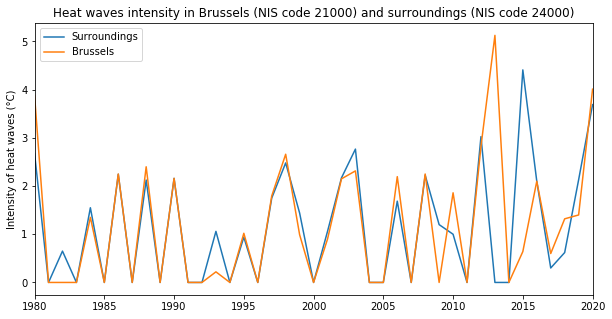

In [94]:
fig, ax = plt.subplots(1, 1)
ax.set(title = "Heat waves intensity in Brussels (NIS code 21000) and surroundings (NIS code 24000)", 
       ylabel = "Intensity of heat waves (°C)")
hw_int_Bru.plot(ax=ax, figsize=(10,5), legend= "True")

In [56]:
import dash
from dash import html
from dash import dcc
import dash_bootstrap_components as dbc
from dash.dependencies import Input, Output
import plotly.express as px

from plotly.subplots import make_subplots

import plotly.graph_objects as go
import numpy as np
import pandas as pd


In [116]:
from pyproj import crs
geo_intens=Belgium_shapes_intens.to_crs(epsg=4326)
json_intens= geo_intens.__geo_interface__ 
geo_freq=Belgium_shapes_merge.to_crs(epsg=4326)
json_freq= geo_freq.__geo_interface__ 
fig = px.choropleth(
       Belgium_shapes_merge, geojson=json_freq,locations=Belgium_shapes_merge.index, color='2000-2004',
    color_continuous_scale='reds',hover_name='Name1'
      )
fig.update_geos(fitbounds="locations", visible=False)
fig.show()

C:\Users\baris\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6

C:\Users\baris\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



In [198]:
colorscales = []
year={}
for i in range(len(Belgium_shapes_merge.columns[3:])):
   
    year['label'] = Belgium_shapes_merge.columns[i+3]
    year['value'] = Belgium_shapes_merge.columns[i+3]
    colorscales.append(year)
    year={}
colorscales
#[{"label":'2015-2019','value':'2015-2019'},
 #              {"label":'2010-2014','value':'2010-2014'}]

[{'label': '1980', 'value': '1980'},
 {'label': '1981', 'value': '1981'},
 {'label': '1982', 'value': '1982'},
 {'label': '1983', 'value': '1983'},
 {'label': '1984', 'value': '1984'},
 {'label': '1985', 'value': '1985'},
 {'label': '1986', 'value': '1986'},
 {'label': '1987', 'value': '1987'},
 {'label': '1988', 'value': '1988'},
 {'label': '1989', 'value': '1989'},
 {'label': '1990', 'value': '1990'},
 {'label': '1991', 'value': '1991'},
 {'label': '1992', 'value': '1992'},
 {'label': '1993', 'value': '1993'},
 {'label': '1994', 'value': '1994'},
 {'label': '1995', 'value': '1995'},
 {'label': '1996', 'value': '1996'},
 {'label': '1997', 'value': '1997'},
 {'label': '1998', 'value': '1998'},
 {'label': '1999', 'value': '1999'},
 {'label': '2000', 'value': '2000'},
 {'label': '2001', 'value': '2001'},
 {'label': '2002', 'value': '2002'},
 {'label': '2003', 'value': '2003'},
 {'label': '2004', 'value': '2004'},
 {'label': '2005', 'value': '2005'},
 {'label': '2006', 'value': '2006'},
 

In [253]:
from dash import Dash, dcc, html
from dash.dependencies import  Input, Output
import plotly.express as px
import plotly.graph_objs as go

colorscales = []
year={}
for i in range(len(Belgium_shapes_merge.columns[3:])):
   
    year['label'] = Belgium_shapes_merge.columns[i+3]
    year['value'] = Belgium_shapes_merge.columns[i+3]
    colorscales.append(year)
    year={}

app = Dash(__name__)


app.layout = html.Div([
    html.H2('Heatwave Analysis',style={'text-align': 'center'}),
    html.P("Select the year:"),
    dcc.Dropdown(
        id='dropdown', 
        options=colorscales,
        value='1980'
    ),
    
    dbc.Row([
    dbc.Col(dcc.Graph(id="graph"),md=5),
    dbc.Col(dcc.Graph(id="graph2"),md=5)])
    
])


@app.callback(
    Output("graph", "figure"), 
    Input("dropdown", "value"))
def change_colorscale(scale):
    df = Belgium_shapes_merge # replace with your own data source
    fig = px.choropleth(
       df, geojson=json_freq,locations=df.index, color=scale,
    color_continuous_scale=px.colors.sequential.OrRd,hover_name='Name1',range_color=[0,8]
      )
    fig.update_geos(fitbounds="locations", visible=False)
    fig.update_layout(title=f"Heatwave Weeks in <b>{scale}</b>", title_x=0.5)
    return fig

@app.callback(
    Output("graph2", "figure"), 
    Input("dropdown", "value"))
def change_colorscale2(scale):
    df = Belgium_shapes_intens # replace with your own data source
    fig2 = px.choropleth(
       df, geojson=json_intens,locations=df.index, color=scale,
    color_continuous_scale=px.colors.sequential.OrRd,hover_name='Name1',range_color=[0,5.126667]
      )
    fig2.update_geos(fitbounds="locations", visible=False)
    fig2.update_layout(title=f"Heatwave Intensity in <b>{scale}</b>", title_x=0.5)
    return fig2


app.run_server(debug=True,use_reloader=False)

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is run

In [204]:
Belgium_shapes_merge

,geometry,arron,Name1,1980,1981,1982,1983,1984,1985,1986,...,2000-2009,2010-2019,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
0,"POLYGON ((662106.376 740967.580, 662162.309 74...",11000,Antwerpen,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
1,"POLYGON ((671311.591 707603.770, 671353.400 70...",12000,Mechelen,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
2,"MULTIPOLYGON (((688864.783 736887.001, 688888....",13000,Turnhout,3,0,2,0,2,0,4,...,1.4,1.4,1.4,1.0,0.8,2.2,1.8,1.0,1.2,1.6
3,"POLYGON ((653270.158 677320.255, 653291.392 67...",21000,Bruxelles,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
4,"POLYGON ((643772.195 692449.425, 643815.652 69...",23000,Halle-Vilvoorde,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
5,"POLYGON ((701677.133 693379.723, 701769.329 69...",24000,Leuven,3,0,2,0,2,0,4,...,1.4,1.4,1.4,1.0,0.8,2.2,1.8,1.0,1.2,1.6
6,"POLYGON ((678427.537 665867.971, 678864.805 66...",25000,Nivelles,1,0,0,0,2,0,4,...,1.5,1.1,0.6,1.0,0.8,2.6,2.0,1.0,1.0,1.2
7,"POLYGON ((580249.842 729150.247, 580414.832 72...",31000,Brugge,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
8,"POLYGON ((549345.684 702996.324, 549408.049 70...",32000,Diksmuide,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4
9,"POLYGON ((536532.472 683487.580, 536530.794 68...",33000,Ieper,1,0,0,0,2,0,4,...,1.5,1.4,0.6,1.0,0.6,2.4,2.0,1.0,1.4,1.4


In [152]:
intens=heat_fr[heat_fr.columns[:42]].melt(id_vars='arron',var_name='year',value_name='hw_count')

intens.head()

,arron,year,hw_count
0,41000,1980,1
1,11000,1980,1
2,81000,1980,3
3,51000,1980,1
4,45000,1980,1


In [234]:
app_data = Belgium_shapes.merge(intens, on='arron', suffixes=('', '_drop'))
geo_freq=Belgium_shapes.to_crs(epsg=4326)
json_freq= geo_freq.__geo_interface__ 
fig = px.choropleth(
       app_data, geojson=json_freq,locations=app_data.index, color='hw_count',animation_frame='year',
       color_continuous_scale='reds',hover_name='Name1'
      )
fig.update_geos(fitbounds="locations", visible=False)
fig["layout"].pop("updatemenus") # optional, drop animation buttons

fig.show()

C:\Users\baris\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



KeyboardInterrupt: 

In [237]:
from dash import Dash, dcc, html
from dash.dependencies import  Input, Output
import plotly.express as px

colorscales = [{"label":'2015-2019','value':'hw_count'},
               {"label":'heatwaves','value':'arron'}
               ]

app = Dash(__name__)


app.layout = html.Div([
    html.H4('Heatwave Weeks by Arrondisment'),
    html.P("Select the color scale:"),
    dcc.Dropdown(
        id='dropdown', 
        options=colorscales,
        value='hw_count'
    ),
    dcc.Graph(id="graph"),
])


@app.callback(
    Output("graph", "figure"), 
    Input("dropdown", "value"))
def change_colorscale(scale):
    df = app_data # replace with your own data source
    fig = px.choropleth(
       df, geojson=json_freq,locations=df.index, color=scale,
    color_continuous_scale='reds',hover_name='Name1',animation_frame="year", animation_group=scale
      )
    fig.update_geos(fitbounds="locations", visible=False)
    fig["layout"].pop("updatemenus") # optional, drop animation buttons

    return fig


app.run_server(debug=True,use_reloader=False)

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is run

In [233]:
from dash import Dash, dcc, html
from dash.dependencies import  Input, Output
import plotly.express as px

colorscales = []
year={}
for i in range(len(Belgium_shapes_merge.columns[3:])):
   
    year['label'] = Belgium_shapes_merge.columns[i+3]
    year['value'] = Belgium_shapes_merge.columns[i+3]
    colorscales.append(year)
    year={}

app = Dash(__name__)

input_groups = dbc.Row(dbc.Col(
    html.Div([dcc.Dropdown(
        id='dropdown', 
        options=colorscales,
        value='2010-2014')])),
    dbc.Col(html.Div(   [     
               dcc.Dropdown(
        id='dropdown2', 
        options=[{'label':'Number of Heatwave Weeks','value':Belgium_shapes_merge},
                {'label':'intensity','value':Belgium_shapes_intens}],
        value=Belgium_shapes_merge)]
    
))) 

app.layout = dbc.Container( [html.Div([
    html.H4('Heatwave Weeks by Arrondisment'),
    html.P("Select the color scale:"),
    html.Hr(),
     dbc.Row(
            [
                dbc.Col(input_groups, md=2),
                dbc.Col(dcc.Graph(id="graph")),
            ],
            align="center"
        ),
    
            ]
        )
])


@app.callback(
    Output("graph", "figure"), 
    [Input("dropdown", "value"),
    Input("dropdown2","value")])
def change_colorscale(scale,data):
    df = data # replace with your own data source
    fig = px.choropleth(
       df, geojson=json_freq,locations=df.index, color=scale,
    color_continuous_scale=px.colors.sequential.OrRd,hover_name='Name1'
      )
    fig.update_geos(fitbounds="locations", visible=False)

    return fig


app.run_server(debug=True,use_reloader=False)

TypeError: The `dash_bootstrap_components.Row` component (version 1.1.0) with the ID "Col(Div([Dropdown(options=[{'label': 'Number of Heatwave Weeks', 'value':                                              geometry  arron  \
0   POLYGON ((662106.376 740967.580, 662162.309 74...  11000   
1   POLYGON ((671311.591 707603.770, 671353.400 70...  12000   
2   MULTIPOLYGON (((688864.783 736887.001, 688888....  13000   
3   POLYGON ((653270.158 677320.255, 653291.392 67...  21000   
4   POLYGON ((643772.195 692449.425, 643815.652 69...  23000   
5   POLYGON ((701677.133 693379.723, 701769.329 69...  24000   
6   POLYGON ((678427.537 665867.971, 678864.805 66...  25000   
7   POLYGON ((580249.842 729150.247, 580414.832 72...  31000   
8   POLYGON ((549345.684 702996.324, 549408.049 70...  32000   
9   POLYGON ((536532.472 683487.580, 536530.794 68...  33000   
10  POLYGON ((582987.896 678249.557, 583022.925 67...  34000   
11  POLYGON ((557697.746 713007.931, 557658.430 71...  35000   
12  POLYGON ((566681.441 690911.521, 566773.467 69...  36000   
13  POLYGON ((577016.591 699501.019, 577326.744 69...  37000   
14  POLYGON ((537850.005 704366.450, 537895.501 70...  38000   
15  POLYGON ((627860.981 687089.708, 627885.528 68...  41000   
16  POLYGON ((633377.371 702320.703, 633391.614 70...  42000   
17  POLYGON ((599123.501 720170.853, 599204.520 72...  43000   
18  POLYGON ((623042.799 711540.367, 622954.541 71...  44000   
19  POLYGON ((591768.911 682304.216, 591768.671 68...  45000   
20  POLYGON ((645253.736 716853.096, 645250.591 71...  46000   
21  POLYGON ((603569.584 662857.738, 603622.451 66...  51000   
22  POLYGON ((640881.423 643321.814, 640905.314 64...  52000   
23  POLYGON ((618751.748 644443.665, 618806.254 64...  53000   
24  MULTIPOLYGON (((570833.751 661271.643, 570881....  54000   
25  POLYGON ((611019.349 659917.428, 611041.220 65...  55000   
26  POLYGON ((642382.189 628760.338, 642445.883 62...  56000   
27  POLYGON ((585970.734 661820.584, 586005.045 66...  57000   
28  POLYGON ((716237.443 646541.614, 716291.862 64...  61000   
29  POLYGON ((743662.180 666858.183, 743649.244 66...  62000   
30  POLYGON ((764220.774 661548.203, 764314.825 66...  63000   
31  POLYGON ((697781.287 658170.446, 697803.661 65...  64000   
32  POLYGON ((713457.975 703095.656, 713629.530 70...  71000   
33  POLYGON ((731560.299 719069.690, 731686.236 71...  72000   
34  MULTIPOLYGON (((749978.705 662960.017, 750031....  73000   
35  POLYGON ((749773.580 560364.949, 749727.074 56...  81000   
36  POLYGON ((758288.775 615386.134, 758341.857 61...  82000   
37  POLYGON ((726523.520 623862.340, 726612.386 62...  83000   
38  POLYGON ((700480.389 587228.925, 700535.558 58...  84000   
39  POLYGON ((725306.823 553301.529, 725340.848 55...  85000   
40  POLYGON ((710623.428 623244.093, 711014.874 62...  91000   
41  POLYGON ((692478.923 648574.540, 692531.426 64...  92000   
42  POLYGON ((659710.905 612956.495, 659749.964 61...  93000   

                Name1  1980  1981  1982  1983  1984  1985  1986  ...  \
0           Antwerpen     1     0     0     0     2     0     4  ...   
1            Mechelen     1     0     0     0     2     0     4  ...   
2            Turnhout     3     0     2     0     2     0     4  ...   
3           Bruxelles     1     0     0     0     2     0     4  ...   
4     Halle-Vilvoorde     1     0     0     0     2     0     4  ...   
5              Leuven     3     0     2     0     2     0     4  ...   
6            Nivelles     1     0     0     0     2     0     4  ...   
7              Brugge     1     0     0     0     2     0     4  ...   
8           Diksmuide     1     0     0     0     2     0     4  ...   
9               Ieper     1     0     0     0     2     0     4  ...   
10           Kortrijk     1     0     0     0     2     0     4  ...   
11           Oostende     1     0     0     0     2     0     4  ...   
12          Roeselare     1     0     0     0     2     0     4  ...   
13              Tielt     1     0     0     0     2     0     4  ...   
14             Veurne     1     0     0     0     2     0     4  ...   
15              Aalst     1     0     0     0     2     0     4  ...   
16        Dendermonde     1     0     0     0     2     0     4  ...   
17              Eeklo     1     0     0     0     2     0     4  ...   
18               Gent     1     0     0     0     2     0     4  ...   
19         Oudenaarde     1     0     0     0     2     0     4  ...   
20       Sint-Niklaas     1     0     0     0     2     0     4  ...   
21                Ath     1     0     0     0     2     0     4  ...   
22          Charleroi     1     0     0     0     2     0     4  ...   
23               Mons     1     0     0     0     2     0     4  ...   
24           Mouscron     1     0     0     0     2     0     4  ...   
25           Soignies     1     0     0     0     2     0     4  ...   
26              Thuin     1     0     0     0     2     0     4  ...   
27            Tournai     1     0     0     0     2     0     4  ...   
28                Huy     3     0     2     0     2     0     4  ...   
29              Liège     3     0     2     0     2     0     4  ...   
30           Verviers     3     0     2     0     2     0     4  ...   
31            Waremme     3     0     2     0     2     0     4  ...   
32            Hasselt     3     0     3     0     3     0     4  ...   
33            Maaseik     3     0     3     0     3     0     4  ...   
34           Tongeren     3     0     2     0     2     0     4  ...   
35              Arlon     3     0     2     0     2     0     4  ...   
36           Bastogne     3     0     2     0     2     0     4  ...   
37  Marche-en-Famenne     3     0     2     0     2     0     4  ...   
38        Neufchâteau     3     0     2     0     2     0     4  ...   
39             Virton     3     0     2     0     2     0     4  ...   
40             Dinant     3     0     2     0     2     0     4  ...   
41              Namur     3     0     2     0     2     0     4  ...   
42      Philippeville     1     0     0     0     2     0     4  ...   

    2000-2009  2010-2019  1980-1984  1985-1989  1990-1994  1995-1999  \
0         1.5        1.4        0.6        1.0        0.6        2.4   
1         1.5        1.4        0.6        1.0        0.6        2.4   
2         1.4        1.4        1.4        1.0        0.8        2.2   
3         1.5        1.4        0.6        1.0        0.6        2.4   
4         1.5        1.4        0.6        1.0        0.6        2.4   
5         1.4        1.4        1.4        1.0        0.8        2.2   
6         1.5        1.1        0.6        1.0        0.8        2.6   
7         1.5        1.4        0.6        1.0        0.6        2.4   
8         1.5        1.4        0.6        1.0        0.6        2.4   
9         1.5        1.4        0.6        1.0        0.6        2.4   
10        1.5        1.4        0.6        1.0        0.6        2.4   
11        1.5        1.4        0.6        1.0        0.6        2.4   
12        1.5        1.4        0.6        1.0        0.6        2.4   
13        1.5        1.4        0.6        1.0        0.6        2.4   
14        1.5        1.4        0.6        1.0        0.6        2.4   
15        1.5        1.4        0.6        1.0        0.6        2.4   
16        1.5        1.4        0.6        1.0        0.6        2.4   
17        1.5        1.4        0.6        1.0        0.6        2.4   
18        1.5        1.4        0.6        1.0        0.6        2.4   
19        1.5        1.4        0.6        1.0        0.6        2.4   
20        1.5        1.4        0.6        1.0        0.6        2.4   
21        1.5        1.1        0.6        1.0        0.8        2.6   
22        1.5        1.1        0.6        1.0        0.8        2.6   
23        1.5        1.1        0.6        1.0        0.8        2.6   
24        1.5        1.4        0.6        1.0        0.6        2.4   
25        1.5        1.1        0.6        1.0        0.8        2.6   
26        1.5        1.1        0.6        1.0        0.8        2.6   
27        1.5        1.1        0.6        1.0        0.8        2.6   
28        1.6        2.0        1.4        1.0        1.2        2.0   
29        1.6        2.0        1.4        1.0        1.2        2.0   
30        1.6        2.0        1.4        1.0        1.2        2.0   
31        1.6        2.0        1.4        1.0        1.2        2.0   
32        2.0        1.6        1.8        1.0        1.0        1.6   
33        2.0        1.6        1.8        1.0        1.0        1.6   
34        1.6        2.0        1.4        1.0        1.2        2.0   
35        1.6        2.0        1.4        1.0        1.2        2.0   
36        1.6        2.0        1.4        1.0        1.2        2.0   
37        1.6        2.0        1.4        1.0        1.2        2.0   
38        1.6        2.0        1.4        1.0        1.2        2.0   
39        1.6        2.0        1.4        1.0        1.2        2.0   
40        1.8        1.2        1.4        1.0        0.8        2.0   
41        1.8        1.2        1.4        1.0        0.8        2.0   
42        1.5        1.1        0.6        1.0        0.8        2.6   

    2000-2004  2005-2009  2010-2014  2015-2019  
0         2.0        1.0        1.4        1.4  
1         2.0        1.0        1.4        1.4  
2         1.8        1.0        1.2        1.6  
3         2.0        1.0        1.4        1.4  
4         2.0        1.0        1.4        1.4  
5         1.8        1.0        1.2        1.6  
6         2.0        1.0        1.0        1.2  
7         2.0        1.0        1.4        1.4  
8         2.0        1.0        1.4        1.4  
9         2.0        1.0        1.4        1.4  
10        2.0        1.0        1.4        1.4  
11        2.0        1.0        1.4        1.4  
12        2.0        1.0        1.4        1.4  
13        2.0        1.0        1.4        1.4  
14        2.0        1.0        1.4        1.4  
15        2.0        1.0        1.4        1.4  
16        2.0        1.0        1.4        1.4  
17        2.0        1.0        1.4        1.4  
18        2.0        1.0        1.4        1.4  
19        2.0        1.0        1.4        1.4  
20        2.0        1.0        1.4        1.4  
21        2.0        1.0        1.0        1.2  
22        2.0        1.0        1.0        1.2  
23        2.0        1.0        1.0        1.2  
24        2.0        1.0        1.4        1.4  
25        2.0        1.0        1.0        1.2  
26        2.0        1.0        1.0        1.2  
27        2.0        1.0        1.0        1.2  
28        2.2        1.0        2.0        2.0  
29        2.2        1.0        2.0        2.0  
30        2.2        1.0        2.0        2.0  
31        2.2        1.0        2.0        2.0  
32        2.2        1.8        1.0        2.2  
33        2.2        1.8        1.0        2.2  
34        2.2        1.0        2.0        2.0  
35        2.2        1.0        2.0        2.0  
36        2.2        1.0        2.0        2.0  
37        2.2        1.0        2.0        2.0  
38        2.2        1.0        2.0        2.0  
39        2.2        1.0        2.0        2.0  
40        2.0        1.6        1.0        1.4  
41        2.0        1.6        1.0        1.4  
42        2.0        1.0        1.0        1.2  

[43 rows x 56 columns]}, {'label': 'intensity', 'value':                                              geometry  arron  \
0   POLYGON ((662106.376 740967.580, 662162.309 74...  11000   
1   POLYGON ((671311.591 707603.770, 671353.400 70...  12000   
2   MULTIPOLYGON (((688864.783 736887.001, 688888....  13000   
3   POLYGON ((653270.158 677320.255, 653291.392 67...  21000   
4   POLYGON ((643772.195 692449.425, 643815.652 69...  23000   
5   POLYGON ((701677.133 693379.723, 701769.329 69...  24000   
6   POLYGON ((678427.537 665867.971, 678864.805 66...  25000   
7   POLYGON ((580249.842 729150.247, 580414.832 72...  31000   
8   POLYGON ((549345.684 702996.324, 549408.049 70...  32000   
9   POLYGON ((536532.472 683487.580, 536530.794 68...  33000   
10  POLYGON ((582987.896 678249.557, 583022.925 67...  34000   
11  POLYGON ((557697.746 713007.931, 557658.430 71...  35000   
12  POLYGON ((566681.441 690911.521, 566773.467 69...  36000   
13  POLYGON ((577016.591 699501.019, 577326.744 69...  37000   
14  POLYGON ((537850.005 704366.450, 537895.501 70...  38000   
15  POLYGON ((627860.981 687089.708, 627885.528 68...  41000   
16  POLYGON ((633377.371 702320.703, 633391.614 70...  42000   
17  POLYGON ((599123.501 720170.853, 599204.520 72...  43000   
18  POLYGON ((623042.799 711540.367, 622954.541 71...  44000   
19  POLYGON ((591768.911 682304.216, 591768.671 68...  45000   
20  POLYGON ((645253.736 716853.096, 645250.591 71...  46000   
21  POLYGON ((603569.584 662857.738, 603622.451 66...  51000   
22  POLYGON ((640881.423 643321.814, 640905.314 64...  52000   
23  POLYGON ((618751.748 644443.665, 618806.254 64...  53000   
24  MULTIPOLYGON (((570833.751 661271.643, 570881....  54000   
25  POLYGON ((611019.349 659917.428, 611041.220 65...  55000   
26  POLYGON ((642382.189 628760.338, 642445.883 62...  56000   
27  POLYGON ((585970.734 661820.584, 586005.045 66...  57000   
28  POLYGON ((716237.443 646541.614, 716291.862 64...  61000   
29  POLYGON ((743662.180 666858.183, 743649.244 66...  62000   
30  POLYGON ((764220.774 661548.203, 764314.825 66...  63000   
31  POLYGON ((697781.287 658170.446, 697803.661 65...  64000   
32  POLYGON ((713457.975 703095.656, 713629.530 70...  71000   
33  POLYGON ((731560.299 719069.690, 731686.236 71...  72000   
34  MULTIPOLYGON (((749978.705 662960.017, 750031....  73000   
35  POLYGON ((749773.580 560364.949, 749727.074 56...  81000   
36  POLYGON ((758288.775 615386.134, 758341.857 61...  82000   
37  POLYGON ((726523.520 623862.340, 726612.386 62...  83000   
38  POLYGON ((700480.389 587228.925, 700535.558 58...  84000   
39  POLYGON ((725306.823 553301.529, 725340.848 55...  85000   
40  POLYGON ((710623.428 623244.093, 711014.874 62...  91000   
41  POLYGON ((692478.923 648574.540, 692531.426 64...  92000   
42  POLYGON ((659710.905 612956.495, 659749.964 61...  93000   

                Name1      1980  1981      1982  1983   1984  1985   1986  \
0           Antwerpen  3.875000     0  0.000000     0  1.350     0  2.250   
1            Mechelen  3.875000     0  0.000000     0  1.350     0  2.250   
2            Turnhout  2.675000     0  0.650000     0  1.550     0  2.245   
3           Bruxelles  3.875000     0  0.000000     0  1.350     0  2.250   
4     Halle-Vilvoorde  3.875000     0  0.000000     0  1.350     0  2.250   
5              Leuven  2.675000     0  0.650000     0  1.550     0  2.245   
6            Nivelles  3.875000     0  0.000000     0  1.350     0  2.250   
7              Brugge  3.875000     0  0.000000     0  1.350     0  2.250   
8           Diksmuide  3.875000     0  0.000000     0  1.350     0  2.250   
9               Ieper  3.875000     0  0.000000     0  1.350     0  2.250   
10           Kortrijk  3.875000     0  0.000000     0  1.350     0  2.250   
11           Oostende  3.875000     0  0.000000     0  1.350     0  2.250   
12          Roeselare  3.875000     0  0.000000     0  1.350     0  2.250   
13              Tielt  3.875000     0  0.000000     0  1.350     0  2.250   
14             Veurne  3.875000     0  0.000000     0  1.350     0  2.250   
15              Aalst  3.875000     0  0.000000     0  1.350     0  2.250   
16        Dendermonde  3.875000     0  0.000000     0  1.350     0  2.250   
17              Eeklo  3.875000     0  0.000000     0  1.350     0  2.250   
18               Gent  3.875000     0  0.000000     0  1.350     0  2.250   
19         Oudenaarde  3.875000     0  0.000000     0  1.350     0  2.250   
20       Sint-Niklaas  3.875000     0  0.000000     0  1.350     0  2.250   
21                Ath  3.875000     0  0.000000     0  1.350     0  2.250   
22          Charleroi  3.875000     0  0.000000     0  1.350     0  2.250   
23               Mons  3.875000     0  0.000000     0  1.350     0  2.250   
24           Mouscron  3.875000     0  0.000000     0  1.350     0  2.250   
25           Soignies  3.875000     0  0.000000     0  1.350     0  2.250   
26              Thuin  3.875000     0  0.000000     0  1.350     0  2.250   
27            Tournai  3.875000     0  0.000000     0  1.350     0  2.250   
28                Huy  0.841667     0  1.150000     0  1.025     0  1.720   
29              Liège  0.841667     0  1.150000     0  1.025     0  1.720   
30           Verviers  0.841667     0  1.150000     0  1.025     0  1.720   
31            Waremme  0.841667     0  1.150000     0  1.025     0  1.720   
32            Hasselt  1.041667     0  0.813333     0  2.225     0  1.795   
33            Maaseik  1.041667     0  0.813333     0  2.225     0  1.795   
34           Tongeren  0.841667     0  1.150000     0  1.025     0  1.720   
35              Arlon  0.841667     0  1.150000     0  1.025     0  1.720   
36           Bastogne  0.841667     0  1.150000     0  1.025     0  1.720   
37  Marche-en-Famenne  0.841667     0  1.150000     0  1.025     0  1.720   
38        Neufchâteau  0.841667     0  1.150000     0  1.025     0  1.720   
39             Virton  0.841667     0  1.150000     0  1.025     0  1.720   
40             Dinant  2.508333     0  0.420000     0  1.550     0  1.765   
41              Namur  2.508333     0  0.420000     0  1.550     0  1.765   
42      Philippeville  3.875000     0  0.000000     0  1.350     0  2.250   

    ...  1990-1994  1995-1999  2000-2004  2005-2009  2010-2014  2015-2019  \
0   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
1   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
2   ...      0.644   1.322000   1.199333   1.022333   0.805000      1.912   
3   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
4   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
5   ...      0.644   1.322000   1.199333   1.022333   0.805000      1.912   
6   ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
7   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
8   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
9   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
10  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
11  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
12  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
13  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
14  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
15  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
16  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
17  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
18  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
19  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
20  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
21  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
22  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
23  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
24  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
25  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
26  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
27  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
28  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
29  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
30  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
31  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
32  ...      0.572   1.059000   1.451714   0.758667   0.864000      1.961   
33  ...      0.572   1.059000   1.451714   0.758667   0.864000      1.961   
34  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
35  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
36  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
37  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
38  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
39  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
40  ...      0.614   1.508000   1.264571   0.668000   1.169333      1.841   
41  ...      0.614   1.508000   1.264571   0.668000   1.169333      1.841   
42  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   

    1980-1989  1990-1999  2000-2009  2010-2019  
0    0.987500   0.884500   0.980929   1.587167  
1    0.987500   0.884500   0.980929   1.587167  
2    0.924500   0.983000   1.110833   1.358500  
3    0.987500   0.884500   0.980929   1.587167  
4    0.987500   0.884500   0.980929   1.587167  
5    0.924500   0.983000   1.110833   1.358500  
6    0.987500   1.019667   1.081571   1.211833  
7    0.987500   0.884500   0.980929   1.587167  
8    0.987500   0.884500   0.980929   1.587167  
9    0.987500   0.884500   0.980929   1.587167  
10   0.987500   0.884500   0.980929   1.587167  
11   0.987500   0.884500   0.980929   1.587167  
12   0.987500   0.884500   0.980929   1.587167  
13   0.987500   0.884500   0.980929   1.587167  
14   0.987500   0.884500   0.980929   1.587167  
15   0.987500   0.884500   0.980929   1.587167  
16   0.987500   0.884500   0.980929   1.587167  
17   0.987500   0.884500   0.980929   1.587167  
18   0.987500   0.884500   0.980929   1.587167  
19   0.987500   0.884500   0.980929   1.587167  
20   0.987500   0.884500   0.980929   1.587167  
21   0.987500   1.019667   1.081571   1.211833  
22   0.987500   1.019667   1.081571   1.211833  
23   0.987500   1.019667   1.081571   1.211833  
24   0.987500   0.884500   0.980929   1.587167  
25   0.987500   1.019667   1.081571   1.211833  
26   0.987500   1.019667   1.081571   1.211833  
27   0.987500   1.019667   1.081571   1.211833  
28   0.673667   0.882500   0.992000   1.524357  
29   0.673667   0.882500   0.992000   1.524357  
30   0.673667   0.882500   0.992000   1.524357  
31   0.673667   0.882500   0.992000   1.524357  
32   0.790000   0.815500   1.105190   1.412500  
33   0.790000   0.815500   1.105190   1.412500  
34   0.673667   0.882500   0.992000   1.524357  
35   0.673667   0.882500   0.992000   1.524357  
36   0.673667   0.882500   0.992000   1.524357  
37   0.673667   0.882500   0.992000   1.524357  
38   0.673667   0.882500   0.992000   1.524357  
39   0.673667   0.882500   0.992000   1.524357  
40   0.846833   1.061000   0.966286   1.505167  
41   0.846833   1.061000   0.966286   1.505167  
42   0.987500   1.019667   1.081571   1.211833  

[43 rows x 56 columns]}], value=                                             geometry  arron  \
0   POLYGON ((662106.376 740967.580, 662162.309 74...  11000   
1   POLYGON ((671311.591 707603.770, 671353.400 70...  12000   
2   MULTIPOLYGON (((688864.783 736887.001, 688888....  13000   
3   POLYGON ((653270.158 677320.255, 653291.392 67...  21000   
4   POLYGON ((643772.195 692449.425, 643815.652 69...  23000   
5   POLYGON ((701677.133 693379.723, 701769.329 69...  24000   
6   POLYGON ((678427.537 665867.971, 678864.805 66...  25000   
7   POLYGON ((580249.842 729150.247, 580414.832 72...  31000   
8   POLYGON ((549345.684 702996.324, 549408.049 70...  32000   
9   POLYGON ((536532.472 683487.580, 536530.794 68...  33000   
10  POLYGON ((582987.896 678249.557, 583022.925 67...  34000   
11  POLYGON ((557697.746 713007.931, 557658.430 71...  35000   
12  POLYGON ((566681.441 690911.521, 566773.467 69...  36000   
13  POLYGON ((577016.591 699501.019, 577326.744 69...  37000   
14  POLYGON ((537850.005 704366.450, 537895.501 70...  38000   
15  POLYGON ((627860.981 687089.708, 627885.528 68...  41000   
16  POLYGON ((633377.371 702320.703, 633391.614 70...  42000   
17  POLYGON ((599123.501 720170.853, 599204.520 72...  43000   
18  POLYGON ((623042.799 711540.367, 622954.541 71...  44000   
19  POLYGON ((591768.911 682304.216, 591768.671 68...  45000   
20  POLYGON ((645253.736 716853.096, 645250.591 71...  46000   
21  POLYGON ((603569.584 662857.738, 603622.451 66...  51000   
22  POLYGON ((640881.423 643321.814, 640905.314 64...  52000   
23  POLYGON ((618751.748 644443.665, 618806.254 64...  53000   
24  MULTIPOLYGON (((570833.751 661271.643, 570881....  54000   
25  POLYGON ((611019.349 659917.428, 611041.220 65...  55000   
26  POLYGON ((642382.189 628760.338, 642445.883 62...  56000   
27  POLYGON ((585970.734 661820.584, 586005.045 66...  57000   
28  POLYGON ((716237.443 646541.614, 716291.862 64...  61000   
29  POLYGON ((743662.180 666858.183, 743649.244 66...  62000   
30  POLYGON ((764220.774 661548.203, 764314.825 66...  63000   
31  POLYGON ((697781.287 658170.446, 697803.661 65...  64000   
32  POLYGON ((713457.975 703095.656, 713629.530 70...  71000   
33  POLYGON ((731560.299 719069.690, 731686.236 71...  72000   
34  MULTIPOLYGON (((749978.705 662960.017, 750031....  73000   
35  POLYGON ((749773.580 560364.949, 749727.074 56...  81000   
36  POLYGON ((758288.775 615386.134, 758341.857 61...  82000   
37  POLYGON ((726523.520 623862.340, 726612.386 62...  83000   
38  POLYGON ((700480.389 587228.925, 700535.558 58...  84000   
39  POLYGON ((725306.823 553301.529, 725340.848 55...  85000   
40  POLYGON ((710623.428 623244.093, 711014.874 62...  91000   
41  POLYGON ((692478.923 648574.540, 692531.426 64...  92000   
42  POLYGON ((659710.905 612956.495, 659749.964 61...  93000   

                Name1  1980  1981  1982  1983  1984  1985  1986  ...  \
0           Antwerpen     1     0     0     0     2     0     4  ...   
1            Mechelen     1     0     0     0     2     0     4  ...   
2            Turnhout     3     0     2     0     2     0     4  ...   
3           Bruxelles     1     0     0     0     2     0     4  ...   
4     Halle-Vilvoorde     1     0     0     0     2     0     4  ...   
5              Leuven     3     0     2     0     2     0     4  ...   
6            Nivelles     1     0     0     0     2     0     4  ...   
7              Brugge     1     0     0     0     2     0     4  ...   
8           Diksmuide     1     0     0     0     2     0     4  ...   
9               Ieper     1     0     0     0     2     0     4  ...   
10           Kortrijk     1     0     0     0     2     0     4  ...   
11           Oostende     1     0     0     0     2     0     4  ...   
12          Roeselare     1     0     0     0     2     0     4  ...   
13              Tielt     1     0     0     0     2     0     4  ...   
14             Veurne     1     0     0     0     2     0     4  ...   
15              Aalst     1     0     0     0     2     0     4  ...   
16        Dendermonde     1     0     0     0     2     0     4  ...   
17              Eeklo     1     0     0     0     2     0     4  ...   
18               Gent     1     0     0     0     2     0     4  ...   
19         Oudenaarde     1     0     0     0     2     0     4  ...   
20       Sint-Niklaas     1     0     0     0     2     0     4  ...   
21                Ath     1     0     0     0     2     0     4  ...   
22          Charleroi     1     0     0     0     2     0     4  ...   
23               Mons     1     0     0     0     2     0     4  ...   
24           Mouscron     1     0     0     0     2     0     4  ...   
25           Soignies     1     0     0     0     2     0     4  ...   
26              Thuin     1     0     0     0     2     0     4  ...   
27            Tournai     1     0     0     0     2     0     4  ...   
28                Huy     3     0     2     0     2     0     4  ...   
29              Liège     3     0     2     0     2     0     4  ...   
30           Verviers     3     0     2     0     2     0     4  ...   
31            Waremme     3     0     2     0     2     0     4  ...   
32            Hasselt     3     0     3     0     3     0     4  ...   
33            Maaseik     3     0     3     0     3     0     4  ...   
34           Tongeren     3     0     2     0     2     0     4  ...   
35              Arlon     3     0     2     0     2     0     4  ...   
36           Bastogne     3     0     2     0     2     0     4  ...   
37  Marche-en-Famenne     3     0     2     0     2     0     4  ...   
38        Neufchâteau     3     0     2     0     2     0     4  ...   
39             Virton     3     0     2     0     2     0     4  ...   
40             Dinant     3     0     2     0     2     0     4  ...   
41              Namur     3     0     2     0     2     0     4  ...   
42      Philippeville     1     0     0     0     2     0     4  ...   

    2000-2009  2010-2019  1980-1984  1985-1989  1990-1994  1995-1999  \
0         1.5        1.4        0.6        1.0        0.6        2.4   
1         1.5        1.4        0.6        1.0        0.6        2.4   
2         1.4        1.4        1.4        1.0        0.8        2.2   
3         1.5        1.4        0.6        1.0        0.6        2.4   
4         1.5        1.4        0.6        1.0        0.6        2.4   
5         1.4        1.4        1.4        1.0        0.8        2.2   
6         1.5        1.1        0.6        1.0        0.8        2.6   
7         1.5        1.4        0.6        1.0        0.6        2.4   
8         1.5        1.4        0.6        1.0        0.6        2.4   
9         1.5        1.4        0.6        1.0        0.6        2.4   
10        1.5        1.4        0.6        1.0        0.6        2.4   
11        1.5        1.4        0.6        1.0        0.6        2.4   
12        1.5        1.4        0.6        1.0        0.6        2.4   
13        1.5        1.4        0.6        1.0        0.6        2.4   
14        1.5        1.4        0.6        1.0        0.6        2.4   
15        1.5        1.4        0.6        1.0        0.6        2.4   
16        1.5        1.4        0.6        1.0        0.6        2.4   
17        1.5        1.4        0.6        1.0        0.6        2.4   
18        1.5        1.4        0.6        1.0        0.6        2.4   
19        1.5        1.4        0.6        1.0        0.6        2.4   
20        1.5        1.4        0.6        1.0        0.6        2.4   
21        1.5        1.1        0.6        1.0        0.8        2.6   
22        1.5        1.1        0.6        1.0        0.8        2.6   
23        1.5        1.1        0.6        1.0        0.8        2.6   
24        1.5        1.4        0.6        1.0        0.6        2.4   
25        1.5        1.1        0.6        1.0        0.8        2.6   
26        1.5        1.1        0.6        1.0        0.8        2.6   
27        1.5        1.1        0.6        1.0        0.8        2.6   
28        1.6        2.0        1.4        1.0        1.2        2.0   
29        1.6        2.0        1.4        1.0        1.2        2.0   
30        1.6        2.0        1.4        1.0        1.2        2.0   
31        1.6        2.0        1.4        1.0        1.2        2.0   
32        2.0        1.6        1.8        1.0        1.0        1.6   
33        2.0        1.6        1.8        1.0        1.0        1.6   
34        1.6        2.0        1.4        1.0        1.2        2.0   
35        1.6        2.0        1.4        1.0        1.2        2.0   
36        1.6        2.0        1.4        1.0        1.2        2.0   
37        1.6        2.0        1.4        1.0        1.2        2.0   
38        1.6        2.0        1.4        1.0        1.2        2.0   
39        1.6        2.0        1.4        1.0        1.2        2.0   
40        1.8        1.2        1.4        1.0        0.8        2.0   
41        1.8        1.2        1.4        1.0        0.8        2.0   
42        1.5        1.1        0.6        1.0        0.8        2.6   

    2000-2004  2005-2009  2010-2014  2015-2019  
0         2.0        1.0        1.4        1.4  
1         2.0        1.0        1.4        1.4  
2         1.8        1.0        1.2        1.6  
3         2.0        1.0        1.4        1.4  
4         2.0        1.0        1.4        1.4  
5         1.8        1.0        1.2        1.6  
6         2.0        1.0        1.0        1.2  
7         2.0        1.0        1.4        1.4  
8         2.0        1.0        1.4        1.4  
9         2.0        1.0        1.4        1.4  
10        2.0        1.0        1.4        1.4  
11        2.0        1.0        1.4        1.4  
12        2.0        1.0        1.4        1.4  
13        2.0        1.0        1.4        1.4  
14        2.0        1.0        1.4        1.4  
15        2.0        1.0        1.4        1.4  
16        2.0        1.0        1.4        1.4  
17        2.0        1.0        1.4        1.4  
18        2.0        1.0        1.4        1.4  
19        2.0        1.0        1.4        1.4  
20        2.0        1.0        1.4        1.4  
21        2.0        1.0        1.0        1.2  
22        2.0        1.0        1.0        1.2  
23        2.0        1.0        1.0        1.2  
24        2.0        1.0        1.4        1.4  
25        2.0        1.0        1.0        1.2  
26        2.0        1.0        1.0        1.2  
27        2.0        1.0        1.0        1.2  
28        2.2        1.0        2.0        2.0  
29        2.2        1.0        2.0        2.0  
30        2.2        1.0        2.0        2.0  
31        2.2        1.0        2.0        2.0  
32        2.2        1.8        1.0        2.2  
33        2.2        1.8        1.0        2.2  
34        2.2        1.0        2.0        2.0  
35        2.2        1.0        2.0        2.0  
36        2.2        1.0        2.0        2.0  
37        2.2        1.0        2.0        2.0  
38        2.2        1.0        2.0        2.0  
39        2.2        1.0        2.0        2.0  
40        2.0        1.6        1.0        1.4  
41        2.0        1.6        1.0        1.4  
42        2.0        1.0        1.0        1.2  

[43 rows x 56 columns], id='dropdown2')]))" detected a Component for a prop other than `children`
Prop id has value Col(Div([Dropdown(options=[{'label': 'Number of Heatwave Weeks', 'value':                                              geometry  arron  \
0   POLYGON ((662106.376 740967.580, 662162.309 74...  11000   
1   POLYGON ((671311.591 707603.770, 671353.400 70...  12000   
2   MULTIPOLYGON (((688864.783 736887.001, 688888....  13000   
3   POLYGON ((653270.158 677320.255, 653291.392 67...  21000   
4   POLYGON ((643772.195 692449.425, 643815.652 69...  23000   
5   POLYGON ((701677.133 693379.723, 701769.329 69...  24000   
6   POLYGON ((678427.537 665867.971, 678864.805 66...  25000   
7   POLYGON ((580249.842 729150.247, 580414.832 72...  31000   
8   POLYGON ((549345.684 702996.324, 549408.049 70...  32000   
9   POLYGON ((536532.472 683487.580, 536530.794 68...  33000   
10  POLYGON ((582987.896 678249.557, 583022.925 67...  34000   
11  POLYGON ((557697.746 713007.931, 557658.430 71...  35000   
12  POLYGON ((566681.441 690911.521, 566773.467 69...  36000   
13  POLYGON ((577016.591 699501.019, 577326.744 69...  37000   
14  POLYGON ((537850.005 704366.450, 537895.501 70...  38000   
15  POLYGON ((627860.981 687089.708, 627885.528 68...  41000   
16  POLYGON ((633377.371 702320.703, 633391.614 70...  42000   
17  POLYGON ((599123.501 720170.853, 599204.520 72...  43000   
18  POLYGON ((623042.799 711540.367, 622954.541 71...  44000   
19  POLYGON ((591768.911 682304.216, 591768.671 68...  45000   
20  POLYGON ((645253.736 716853.096, 645250.591 71...  46000   
21  POLYGON ((603569.584 662857.738, 603622.451 66...  51000   
22  POLYGON ((640881.423 643321.814, 640905.314 64...  52000   
23  POLYGON ((618751.748 644443.665, 618806.254 64...  53000   
24  MULTIPOLYGON (((570833.751 661271.643, 570881....  54000   
25  POLYGON ((611019.349 659917.428, 611041.220 65...  55000   
26  POLYGON ((642382.189 628760.338, 642445.883 62...  56000   
27  POLYGON ((585970.734 661820.584, 586005.045 66...  57000   
28  POLYGON ((716237.443 646541.614, 716291.862 64...  61000   
29  POLYGON ((743662.180 666858.183, 743649.244 66...  62000   
30  POLYGON ((764220.774 661548.203, 764314.825 66...  63000   
31  POLYGON ((697781.287 658170.446, 697803.661 65...  64000   
32  POLYGON ((713457.975 703095.656, 713629.530 70...  71000   
33  POLYGON ((731560.299 719069.690, 731686.236 71...  72000   
34  MULTIPOLYGON (((749978.705 662960.017, 750031....  73000   
35  POLYGON ((749773.580 560364.949, 749727.074 56...  81000   
36  POLYGON ((758288.775 615386.134, 758341.857 61...  82000   
37  POLYGON ((726523.520 623862.340, 726612.386 62...  83000   
38  POLYGON ((700480.389 587228.925, 700535.558 58...  84000   
39  POLYGON ((725306.823 553301.529, 725340.848 55...  85000   
40  POLYGON ((710623.428 623244.093, 711014.874 62...  91000   
41  POLYGON ((692478.923 648574.540, 692531.426 64...  92000   
42  POLYGON ((659710.905 612956.495, 659749.964 61...  93000   

                Name1  1980  1981  1982  1983  1984  1985  1986  ...  \
0           Antwerpen     1     0     0     0     2     0     4  ...   
1            Mechelen     1     0     0     0     2     0     4  ...   
2            Turnhout     3     0     2     0     2     0     4  ...   
3           Bruxelles     1     0     0     0     2     0     4  ...   
4     Halle-Vilvoorde     1     0     0     0     2     0     4  ...   
5              Leuven     3     0     2     0     2     0     4  ...   
6            Nivelles     1     0     0     0     2     0     4  ...   
7              Brugge     1     0     0     0     2     0     4  ...   
8           Diksmuide     1     0     0     0     2     0     4  ...   
9               Ieper     1     0     0     0     2     0     4  ...   
10           Kortrijk     1     0     0     0     2     0     4  ...   
11           Oostende     1     0     0     0     2     0     4  ...   
12          Roeselare     1     0     0     0     2     0     4  ...   
13              Tielt     1     0     0     0     2     0     4  ...   
14             Veurne     1     0     0     0     2     0     4  ...   
15              Aalst     1     0     0     0     2     0     4  ...   
16        Dendermonde     1     0     0     0     2     0     4  ...   
17              Eeklo     1     0     0     0     2     0     4  ...   
18               Gent     1     0     0     0     2     0     4  ...   
19         Oudenaarde     1     0     0     0     2     0     4  ...   
20       Sint-Niklaas     1     0     0     0     2     0     4  ...   
21                Ath     1     0     0     0     2     0     4  ...   
22          Charleroi     1     0     0     0     2     0     4  ...   
23               Mons     1     0     0     0     2     0     4  ...   
24           Mouscron     1     0     0     0     2     0     4  ...   
25           Soignies     1     0     0     0     2     0     4  ...   
26              Thuin     1     0     0     0     2     0     4  ...   
27            Tournai     1     0     0     0     2     0     4  ...   
28                Huy     3     0     2     0     2     0     4  ...   
29              Liège     3     0     2     0     2     0     4  ...   
30           Verviers     3     0     2     0     2     0     4  ...   
31            Waremme     3     0     2     0     2     0     4  ...   
32            Hasselt     3     0     3     0     3     0     4  ...   
33            Maaseik     3     0     3     0     3     0     4  ...   
34           Tongeren     3     0     2     0     2     0     4  ...   
35              Arlon     3     0     2     0     2     0     4  ...   
36           Bastogne     3     0     2     0     2     0     4  ...   
37  Marche-en-Famenne     3     0     2     0     2     0     4  ...   
38        Neufchâteau     3     0     2     0     2     0     4  ...   
39             Virton     3     0     2     0     2     0     4  ...   
40             Dinant     3     0     2     0     2     0     4  ...   
41              Namur     3     0     2     0     2     0     4  ...   
42      Philippeville     1     0     0     0     2     0     4  ...   

    2000-2009  2010-2019  1980-1984  1985-1989  1990-1994  1995-1999  \
0         1.5        1.4        0.6        1.0        0.6        2.4   
1         1.5        1.4        0.6        1.0        0.6        2.4   
2         1.4        1.4        1.4        1.0        0.8        2.2   
3         1.5        1.4        0.6        1.0        0.6        2.4   
4         1.5        1.4        0.6        1.0        0.6        2.4   
5         1.4        1.4        1.4        1.0        0.8        2.2   
6         1.5        1.1        0.6        1.0        0.8        2.6   
7         1.5        1.4        0.6        1.0        0.6        2.4   
8         1.5        1.4        0.6        1.0        0.6        2.4   
9         1.5        1.4        0.6        1.0        0.6        2.4   
10        1.5        1.4        0.6        1.0        0.6        2.4   
11        1.5        1.4        0.6        1.0        0.6        2.4   
12        1.5        1.4        0.6        1.0        0.6        2.4   
13        1.5        1.4        0.6        1.0        0.6        2.4   
14        1.5        1.4        0.6        1.0        0.6        2.4   
15        1.5        1.4        0.6        1.0        0.6        2.4   
16        1.5        1.4        0.6        1.0        0.6        2.4   
17        1.5        1.4        0.6        1.0        0.6        2.4   
18        1.5        1.4        0.6        1.0        0.6        2.4   
19        1.5        1.4        0.6        1.0        0.6        2.4   
20        1.5        1.4        0.6        1.0        0.6        2.4   
21        1.5        1.1        0.6        1.0        0.8        2.6   
22        1.5        1.1        0.6        1.0        0.8        2.6   
23        1.5        1.1        0.6        1.0        0.8        2.6   
24        1.5        1.4        0.6        1.0        0.6        2.4   
25        1.5        1.1        0.6        1.0        0.8        2.6   
26        1.5        1.1        0.6        1.0        0.8        2.6   
27        1.5        1.1        0.6        1.0        0.8        2.6   
28        1.6        2.0        1.4        1.0        1.2        2.0   
29        1.6        2.0        1.4        1.0        1.2        2.0   
30        1.6        2.0        1.4        1.0        1.2        2.0   
31        1.6        2.0        1.4        1.0        1.2        2.0   
32        2.0        1.6        1.8        1.0        1.0        1.6   
33        2.0        1.6        1.8        1.0        1.0        1.6   
34        1.6        2.0        1.4        1.0        1.2        2.0   
35        1.6        2.0        1.4        1.0        1.2        2.0   
36        1.6        2.0        1.4        1.0        1.2        2.0   
37        1.6        2.0        1.4        1.0        1.2        2.0   
38        1.6        2.0        1.4        1.0        1.2        2.0   
39        1.6        2.0        1.4        1.0        1.2        2.0   
40        1.8        1.2        1.4        1.0        0.8        2.0   
41        1.8        1.2        1.4        1.0        0.8        2.0   
42        1.5        1.1        0.6        1.0        0.8        2.6   

    2000-2004  2005-2009  2010-2014  2015-2019  
0         2.0        1.0        1.4        1.4  
1         2.0        1.0        1.4        1.4  
2         1.8        1.0        1.2        1.6  
3         2.0        1.0        1.4        1.4  
4         2.0        1.0        1.4        1.4  
5         1.8        1.0        1.2        1.6  
6         2.0        1.0        1.0        1.2  
7         2.0        1.0        1.4        1.4  
8         2.0        1.0        1.4        1.4  
9         2.0        1.0        1.4        1.4  
10        2.0        1.0        1.4        1.4  
11        2.0        1.0        1.4        1.4  
12        2.0        1.0        1.4        1.4  
13        2.0        1.0        1.4        1.4  
14        2.0        1.0        1.4        1.4  
15        2.0        1.0        1.4        1.4  
16        2.0        1.0        1.4        1.4  
17        2.0        1.0        1.4        1.4  
18        2.0        1.0        1.4        1.4  
19        2.0        1.0        1.4        1.4  
20        2.0        1.0        1.4        1.4  
21        2.0        1.0        1.0        1.2  
22        2.0        1.0        1.0        1.2  
23        2.0        1.0        1.0        1.2  
24        2.0        1.0        1.4        1.4  
25        2.0        1.0        1.0        1.2  
26        2.0        1.0        1.0        1.2  
27        2.0        1.0        1.0        1.2  
28        2.2        1.0        2.0        2.0  
29        2.2        1.0        2.0        2.0  
30        2.2        1.0        2.0        2.0  
31        2.2        1.0        2.0        2.0  
32        2.2        1.8        1.0        2.2  
33        2.2        1.8        1.0        2.2  
34        2.2        1.0        2.0        2.0  
35        2.2        1.0        2.0        2.0  
36        2.2        1.0        2.0        2.0  
37        2.2        1.0        2.0        2.0  
38        2.2        1.0        2.0        2.0  
39        2.2        1.0        2.0        2.0  
40        2.0        1.6        1.0        1.4  
41        2.0        1.6        1.0        1.4  
42        2.0        1.0        1.0        1.2  

[43 rows x 56 columns]}, {'label': 'intensity', 'value':                                              geometry  arron  \
0   POLYGON ((662106.376 740967.580, 662162.309 74...  11000   
1   POLYGON ((671311.591 707603.770, 671353.400 70...  12000   
2   MULTIPOLYGON (((688864.783 736887.001, 688888....  13000   
3   POLYGON ((653270.158 677320.255, 653291.392 67...  21000   
4   POLYGON ((643772.195 692449.425, 643815.652 69...  23000   
5   POLYGON ((701677.133 693379.723, 701769.329 69...  24000   
6   POLYGON ((678427.537 665867.971, 678864.805 66...  25000   
7   POLYGON ((580249.842 729150.247, 580414.832 72...  31000   
8   POLYGON ((549345.684 702996.324, 549408.049 70...  32000   
9   POLYGON ((536532.472 683487.580, 536530.794 68...  33000   
10  POLYGON ((582987.896 678249.557, 583022.925 67...  34000   
11  POLYGON ((557697.746 713007.931, 557658.430 71...  35000   
12  POLYGON ((566681.441 690911.521, 566773.467 69...  36000   
13  POLYGON ((577016.591 699501.019, 577326.744 69...  37000   
14  POLYGON ((537850.005 704366.450, 537895.501 70...  38000   
15  POLYGON ((627860.981 687089.708, 627885.528 68...  41000   
16  POLYGON ((633377.371 702320.703, 633391.614 70...  42000   
17  POLYGON ((599123.501 720170.853, 599204.520 72...  43000   
18  POLYGON ((623042.799 711540.367, 622954.541 71...  44000   
19  POLYGON ((591768.911 682304.216, 591768.671 68...  45000   
20  POLYGON ((645253.736 716853.096, 645250.591 71...  46000   
21  POLYGON ((603569.584 662857.738, 603622.451 66...  51000   
22  POLYGON ((640881.423 643321.814, 640905.314 64...  52000   
23  POLYGON ((618751.748 644443.665, 618806.254 64...  53000   
24  MULTIPOLYGON (((570833.751 661271.643, 570881....  54000   
25  POLYGON ((611019.349 659917.428, 611041.220 65...  55000   
26  POLYGON ((642382.189 628760.338, 642445.883 62...  56000   
27  POLYGON ((585970.734 661820.584, 586005.045 66...  57000   
28  POLYGON ((716237.443 646541.614, 716291.862 64...  61000   
29  POLYGON ((743662.180 666858.183, 743649.244 66...  62000   
30  POLYGON ((764220.774 661548.203, 764314.825 66...  63000   
31  POLYGON ((697781.287 658170.446, 697803.661 65...  64000   
32  POLYGON ((713457.975 703095.656, 713629.530 70...  71000   
33  POLYGON ((731560.299 719069.690, 731686.236 71...  72000   
34  MULTIPOLYGON (((749978.705 662960.017, 750031....  73000   
35  POLYGON ((749773.580 560364.949, 749727.074 56...  81000   
36  POLYGON ((758288.775 615386.134, 758341.857 61...  82000   
37  POLYGON ((726523.520 623862.340, 726612.386 62...  83000   
38  POLYGON ((700480.389 587228.925, 700535.558 58...  84000   
39  POLYGON ((725306.823 553301.529, 725340.848 55...  85000   
40  POLYGON ((710623.428 623244.093, 711014.874 62...  91000   
41  POLYGON ((692478.923 648574.540, 692531.426 64...  92000   
42  POLYGON ((659710.905 612956.495, 659749.964 61...  93000   

                Name1      1980  1981      1982  1983   1984  1985   1986  \
0           Antwerpen  3.875000     0  0.000000     0  1.350     0  2.250   
1            Mechelen  3.875000     0  0.000000     0  1.350     0  2.250   
2            Turnhout  2.675000     0  0.650000     0  1.550     0  2.245   
3           Bruxelles  3.875000     0  0.000000     0  1.350     0  2.250   
4     Halle-Vilvoorde  3.875000     0  0.000000     0  1.350     0  2.250   
5              Leuven  2.675000     0  0.650000     0  1.550     0  2.245   
6            Nivelles  3.875000     0  0.000000     0  1.350     0  2.250   
7              Brugge  3.875000     0  0.000000     0  1.350     0  2.250   
8           Diksmuide  3.875000     0  0.000000     0  1.350     0  2.250   
9               Ieper  3.875000     0  0.000000     0  1.350     0  2.250   
10           Kortrijk  3.875000     0  0.000000     0  1.350     0  2.250   
11           Oostende  3.875000     0  0.000000     0  1.350     0  2.250   
12          Roeselare  3.875000     0  0.000000     0  1.350     0  2.250   
13              Tielt  3.875000     0  0.000000     0  1.350     0  2.250   
14             Veurne  3.875000     0  0.000000     0  1.350     0  2.250   
15              Aalst  3.875000     0  0.000000     0  1.350     0  2.250   
16        Dendermonde  3.875000     0  0.000000     0  1.350     0  2.250   
17              Eeklo  3.875000     0  0.000000     0  1.350     0  2.250   
18               Gent  3.875000     0  0.000000     0  1.350     0  2.250   
19         Oudenaarde  3.875000     0  0.000000     0  1.350     0  2.250   
20       Sint-Niklaas  3.875000     0  0.000000     0  1.350     0  2.250   
21                Ath  3.875000     0  0.000000     0  1.350     0  2.250   
22          Charleroi  3.875000     0  0.000000     0  1.350     0  2.250   
23               Mons  3.875000     0  0.000000     0  1.350     0  2.250   
24           Mouscron  3.875000     0  0.000000     0  1.350     0  2.250   
25           Soignies  3.875000     0  0.000000     0  1.350     0  2.250   
26              Thuin  3.875000     0  0.000000     0  1.350     0  2.250   
27            Tournai  3.875000     0  0.000000     0  1.350     0  2.250   
28                Huy  0.841667     0  1.150000     0  1.025     0  1.720   
29              Liège  0.841667     0  1.150000     0  1.025     0  1.720   
30           Verviers  0.841667     0  1.150000     0  1.025     0  1.720   
31            Waremme  0.841667     0  1.150000     0  1.025     0  1.720   
32            Hasselt  1.041667     0  0.813333     0  2.225     0  1.795   
33            Maaseik  1.041667     0  0.813333     0  2.225     0  1.795   
34           Tongeren  0.841667     0  1.150000     0  1.025     0  1.720   
35              Arlon  0.841667     0  1.150000     0  1.025     0  1.720   
36           Bastogne  0.841667     0  1.150000     0  1.025     0  1.720   
37  Marche-en-Famenne  0.841667     0  1.150000     0  1.025     0  1.720   
38        Neufchâteau  0.841667     0  1.150000     0  1.025     0  1.720   
39             Virton  0.841667     0  1.150000     0  1.025     0  1.720   
40             Dinant  2.508333     0  0.420000     0  1.550     0  1.765   
41              Namur  2.508333     0  0.420000     0  1.550     0  1.765   
42      Philippeville  3.875000     0  0.000000     0  1.350     0  2.250   

    ...  1990-1994  1995-1999  2000-2004  2005-2009  2010-2014  2015-2019  \
0   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
1   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
2   ...      0.644   1.322000   1.199333   1.022333   0.805000      1.912   
3   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
4   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
5   ...      0.644   1.322000   1.199333   1.022333   0.805000      1.912   
6   ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
7   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
8   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
9   ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
10  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
11  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
12  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
13  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
14  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
15  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
16  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
17  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
18  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
19  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
20  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
21  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
22  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
23  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
24  ...      0.476   1.293000   1.072857   0.889000   1.962333      1.212   
25  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
26  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
27  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   
28  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
29  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
30  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
31  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
32  ...      0.572   1.059000   1.451714   0.758667   0.864000      1.961   
33  ...      0.572   1.059000   1.451714   0.758667   0.864000      1.961   
34  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
35  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
36  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
37  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
38  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
39  ...      0.560   1.205000   1.264000   0.720000   1.185714      1.863   
40  ...      0.614   1.508000   1.264571   0.668000   1.169333      1.841   
41  ...      0.614   1.508000   1.264571   0.668000   1.169333      1.841   
42  ...      0.642   1.397333   1.325143   0.838000   1.136667      1.287   

    1980-1989  1990-1999  2000-2009  2010-2019  
0    0.987500   0.884500   0.980929   1.587167  
1    0.987500   0.884500   0.980929   1.587167  
2    0.924500   0.983000   1.110833   1.358500  
3    0.987500   0.884500   0.980929   1.587167  
4    0.987500   0.884500   0.980929   1.587167  
5    0.924500   0.983000   1.110833   1.358500  
6    0.987500   1.019667   1.081571   1.211833  
7    0.987500   0.884500   0.980929   1.587167  
8    0.987500   0.884500   0.980929   1.587167  
9    0.987500   0.884500   0.980929   1.587167  
10   0.987500   0.884500   0.980929   1.587167  
11   0.987500   0.884500   0.980929   1.587167  
12   0.987500   0.884500   0.980929   1.587167  
13   0.987500   0.884500   0.980929   1.587167  
14   0.987500   0.884500   0.980929   1.587167  
15   0.987500   0.884500   0.980929   1.587167  
16   0.987500   0.884500   0.980929   1.587167  
17   0.987500   0.884500   0.980929   1.587167  
18   0.987500   0.884500   0.980929   1.587167  
19   0.987500   0.884500   0.980929   1.587167  
20   0.987500   0.884500   0.980929   1.587167  
21   0.987500   1.019667   1.081571   1.211833  
22   0.987500   1.019667   1.081571   1.211833  
23   0.987500   1.019667   1.081571   1.211833  
24   0.987500   0.884500   0.980929   1.587167  
25   0.987500   1.019667   1.081571   1.211833  
26   0.987500   1.019667   1.081571   1.211833  
27   0.987500   1.019667   1.081571   1.211833  
28   0.673667   0.882500   0.992000   1.524357  
29   0.673667   0.882500   0.992000   1.524357  
30   0.673667   0.882500   0.992000   1.524357  
31   0.673667   0.882500   0.992000   1.524357  
32   0.790000   0.815500   1.105190   1.412500  
33   0.790000   0.815500   1.105190   1.412500  
34   0.673667   0.882500   0.992000   1.524357  
35   0.673667   0.882500   0.992000   1.524357  
36   0.673667   0.882500   0.992000   1.524357  
37   0.673667   0.882500   0.992000   1.524357  
38   0.673667   0.882500   0.992000   1.524357  
39   0.673667   0.882500   0.992000   1.524357  
40   0.846833   1.061000   0.966286   1.505167  
41   0.846833   1.061000   0.966286   1.505167  
42   0.987500   1.019667   1.081571   1.211833  

[43 rows x 56 columns]}], value=                                             geometry  arron  \
0   POLYGON ((662106.376 740967.580, 662162.309 74...  11000   
1   POLYGON ((671311.591 707603.770, 671353.400 70...  12000   
2   MULTIPOLYGON (((688864.783 736887.001, 688888....  13000   
3   POLYGON ((653270.158 677320.255, 653291.392 67...  21000   
4   POLYGON ((643772.195 692449.425, 643815.652 69...  23000   
5   POLYGON ((701677.133 693379.723, 701769.329 69...  24000   
6   POLYGON ((678427.537 665867.971, 678864.805 66...  25000   
7   POLYGON ((580249.842 729150.247, 580414.832 72...  31000   
8   POLYGON ((549345.684 702996.324, 549408.049 70...  32000   
9   POLYGON ((536532.472 683487.580, 536530.794 68...  33000   
10  POLYGON ((582987.896 678249.557, 583022.925 67...  34000   
11  POLYGON ((557697.746 713007.931, 557658.430 71...  35000   
12  POLYGON ((566681.441 690911.521, 566773.467 69...  36000   
13  POLYGON ((577016.591 699501.019, 577326.744 69...  37000   
14  POLYGON ((537850.005 704366.450, 537895.501 70...  38000   
15  POLYGON ((627860.981 687089.708, 627885.528 68...  41000   
16  POLYGON ((633377.371 702320.703, 633391.614 70...  42000   
17  POLYGON ((599123.501 720170.853, 599204.520 72...  43000   
18  POLYGON ((623042.799 711540.367, 622954.541 71...  44000   
19  POLYGON ((591768.911 682304.216, 591768.671 68...  45000   
20  POLYGON ((645253.736 716853.096, 645250.591 71...  46000   
21  POLYGON ((603569.584 662857.738, 603622.451 66...  51000   
22  POLYGON ((640881.423 643321.814, 640905.314 64...  52000   
23  POLYGON ((618751.748 644443.665, 618806.254 64...  53000   
24  MULTIPOLYGON (((570833.751 661271.643, 570881....  54000   
25  POLYGON ((611019.349 659917.428, 611041.220 65...  55000   
26  POLYGON ((642382.189 628760.338, 642445.883 62...  56000   
27  POLYGON ((585970.734 661820.584, 586005.045 66...  57000   
28  POLYGON ((716237.443 646541.614, 716291.862 64...  61000   
29  POLYGON ((743662.180 666858.183, 743649.244 66...  62000   
30  POLYGON ((764220.774 661548.203, 764314.825 66...  63000   
31  POLYGON ((697781.287 658170.446, 697803.661 65...  64000   
32  POLYGON ((713457.975 703095.656, 713629.530 70...  71000   
33  POLYGON ((731560.299 719069.690, 731686.236 71...  72000   
34  MULTIPOLYGON (((749978.705 662960.017, 750031....  73000   
35  POLYGON ((749773.580 560364.949, 749727.074 56...  81000   
36  POLYGON ((758288.775 615386.134, 758341.857 61...  82000   
37  POLYGON ((726523.520 623862.340, 726612.386 62...  83000   
38  POLYGON ((700480.389 587228.925, 700535.558 58...  84000   
39  POLYGON ((725306.823 553301.529, 725340.848 55...  85000   
40  POLYGON ((710623.428 623244.093, 711014.874 62...  91000   
41  POLYGON ((692478.923 648574.540, 692531.426 64...  92000   
42  POLYGON ((659710.905 612956.495, 659749.964 61...  93000   

                Name1  1980  1981  1982  1983  1984  1985  1986  ...  \
0           Antwerpen     1     0     0     0     2     0     4  ...   
1            Mechelen     1     0     0     0     2     0     4  ...   
2            Turnhout     3     0     2     0     2     0     4  ...   
3           Bruxelles     1     0     0     0     2     0     4  ...   
4     Halle-Vilvoorde     1     0     0     0     2     0     4  ...   
5              Leuven     3     0     2     0     2     0     4  ...   
6            Nivelles     1     0     0     0     2     0     4  ...   
7              Brugge     1     0     0     0     2     0     4  ...   
8           Diksmuide     1     0     0     0     2     0     4  ...   
9               Ieper     1     0     0     0     2     0     4  ...   
10           Kortrijk     1     0     0     0     2     0     4  ...   
11           Oostende     1     0     0     0     2     0     4  ...   
12          Roeselare     1     0     0     0     2     0     4  ...   
13              Tielt     1     0     0     0     2     0     4  ...   
14             Veurne     1     0     0     0     2     0     4  ...   
15              Aalst     1     0     0     0     2     0     4  ...   
16        Dendermonde     1     0     0     0     2     0     4  ...   
17              Eeklo     1     0     0     0     2     0     4  ...   
18               Gent     1     0     0     0     2     0     4  ...   
19         Oudenaarde     1     0     0     0     2     0     4  ...   
20       Sint-Niklaas     1     0     0     0     2     0     4  ...   
21                Ath     1     0     0     0     2     0     4  ...   
22          Charleroi     1     0     0     0     2     0     4  ...   
23               Mons     1     0     0     0     2     0     4  ...   
24           Mouscron     1     0     0     0     2     0     4  ...   
25           Soignies     1     0     0     0     2     0     4  ...   
26              Thuin     1     0     0     0     2     0     4  ...   
27            Tournai     1     0     0     0     2     0     4  ...   
28                Huy     3     0     2     0     2     0     4  ...   
29              Liège     3     0     2     0     2     0     4  ...   
30           Verviers     3     0     2     0     2     0     4  ...   
31            Waremme     3     0     2     0     2     0     4  ...   
32            Hasselt     3     0     3     0     3     0     4  ...   
33            Maaseik     3     0     3     0     3     0     4  ...   
34           Tongeren     3     0     2     0     2     0     4  ...   
35              Arlon     3     0     2     0     2     0     4  ...   
36           Bastogne     3     0     2     0     2     0     4  ...   
37  Marche-en-Famenne     3     0     2     0     2     0     4  ...   
38        Neufchâteau     3     0     2     0     2     0     4  ...   
39             Virton     3     0     2     0     2     0     4  ...   
40             Dinant     3     0     2     0     2     0     4  ...   
41              Namur     3     0     2     0     2     0     4  ...   
42      Philippeville     1     0     0     0     2     0     4  ...   

    2000-2009  2010-2019  1980-1984  1985-1989  1990-1994  1995-1999  \
0         1.5        1.4        0.6        1.0        0.6        2.4   
1         1.5        1.4        0.6        1.0        0.6        2.4   
2         1.4        1.4        1.4        1.0        0.8        2.2   
3         1.5        1.4        0.6        1.0        0.6        2.4   
4         1.5        1.4        0.6        1.0        0.6        2.4   
5         1.4        1.4        1.4        1.0        0.8        2.2   
6         1.5        1.1        0.6        1.0        0.8        2.6   
7         1.5        1.4        0.6        1.0        0.6        2.4   
8         1.5        1.4        0.6        1.0        0.6        2.4   
9         1.5        1.4        0.6        1.0        0.6        2.4   
10        1.5        1.4        0.6        1.0        0.6        2.4   
11        1.5        1.4        0.6        1.0        0.6        2.4   
12        1.5        1.4        0.6        1.0        0.6        2.4   
13        1.5        1.4        0.6        1.0        0.6        2.4   
14        1.5        1.4        0.6        1.0        0.6        2.4   
15        1.5        1.4        0.6        1.0        0.6        2.4   
16        1.5        1.4        0.6        1.0        0.6        2.4   
17        1.5        1.4        0.6        1.0        0.6        2.4   
18        1.5        1.4        0.6        1.0        0.6        2.4   
19        1.5        1.4        0.6        1.0        0.6        2.4   
20        1.5        1.4        0.6        1.0        0.6        2.4   
21        1.5        1.1        0.6        1.0        0.8        2.6   
22        1.5        1.1        0.6        1.0        0.8        2.6   
23        1.5        1.1        0.6        1.0        0.8        2.6   
24        1.5        1.4        0.6        1.0        0.6        2.4   
25        1.5        1.1        0.6        1.0        0.8        2.6   
26        1.5        1.1        0.6        1.0        0.8        2.6   
27        1.5        1.1        0.6        1.0        0.8        2.6   
28        1.6        2.0        1.4        1.0        1.2        2.0   
29        1.6        2.0        1.4        1.0        1.2        2.0   
30        1.6        2.0        1.4        1.0        1.2        2.0   
31        1.6        2.0        1.4        1.0        1.2        2.0   
32        2.0        1.6        1.8        1.0        1.0        1.6   
33        2.0        1.6        1.8        1.0        1.0        1.6   
34        1.6        2.0        1.4        1.0        1.2        2.0   
35        1.6        2.0        1.4        1.0        1.2        2.0   
36        1.6        2.0        1.4        1.0        1.2        2.0   
37        1.6        2.0        1.4        1.0        1.2        2.0   
38        1.6        2.0        1.4        1.0        1.2        2.0   
39        1.6        2.0        1.4        1.0        1.2        2.0   
40        1.8        1.2        1.4        1.0        0.8        2.0   
41        1.8        1.2        1.4        1.0        0.8        2.0   
42        1.5        1.1        0.6        1.0        0.8        2.6   

    2000-2004  2005-2009  2010-2014  2015-2019  
0         2.0        1.0        1.4        1.4  
1         2.0        1.0        1.4        1.4  
2         1.8        1.0        1.2        1.6  
3         2.0        1.0        1.4        1.4  
4         2.0        1.0        1.4        1.4  
5         1.8        1.0        1.2        1.6  
6         2.0        1.0        1.0        1.2  
7         2.0        1.0        1.4        1.4  
8         2.0        1.0        1.4        1.4  
9         2.0        1.0        1.4        1.4  
10        2.0        1.0        1.4        1.4  
11        2.0        1.0        1.4        1.4  
12        2.0        1.0        1.4        1.4  
13        2.0        1.0        1.4        1.4  
14        2.0        1.0        1.4        1.4  
15        2.0        1.0        1.4        1.4  
16        2.0        1.0        1.4        1.4  
17        2.0        1.0        1.4        1.4  
18        2.0        1.0        1.4        1.4  
19        2.0        1.0        1.4        1.4  
20        2.0        1.0        1.4        1.4  
21        2.0        1.0        1.0        1.2  
22        2.0        1.0        1.0        1.2  
23        2.0        1.0        1.0        1.2  
24        2.0        1.0        1.4        1.4  
25        2.0        1.0        1.0        1.2  
26        2.0        1.0        1.0        1.2  
27        2.0        1.0        1.0        1.2  
28        2.2        1.0        2.0        2.0  
29        2.2        1.0        2.0        2.0  
30        2.2        1.0        2.0        2.0  
31        2.2        1.0        2.0        2.0  
32        2.2        1.8        1.0        2.2  
33        2.2        1.8        1.0        2.2  
34        2.2        1.0        2.0        2.0  
35        2.2        1.0        2.0        2.0  
36        2.2        1.0        2.0        2.0  
37        2.2        1.0        2.0        2.0  
38        2.2        1.0        2.0        2.0  
39        2.2        1.0        2.0        2.0  
40        2.0        1.6        1.0        1.4  
41        2.0        1.6        1.0        1.4  
42        2.0        1.0        1.0        1.2  

[43 rows x 56 columns], id='dropdown2')]))

Did you forget to wrap multiple `children` in an array?
For example, it must be html.Div(["a", "b", "c"]) not html.Div("a", "b", "c")


In [247]:
Belgium_shapes_merge.max().sort_values(ascending=False)

arron        93000.0
2003             8.0
2010             7.0
1998             6.0
2020             5.0
2018             5.0
1986             4.0
1997             4.0
2006             4.0
2008             4.0
1982             3.0
1984             3.0
2013             3.0
1980             3.0
2019             3.0
2009             3.0
1995-1999        2.6
2015-2019        2.2
2000-2004        2.2
2014             2.0
2010-2014        2.0
1991             2.0
1993             2.0
2015             2.0
2010-2019        2.0
1999             2.0
2000-2009        2.0
2002             2.0
2016             2.0
1990             2.0
1980-1984        1.8
2005-2009        1.8
1990-1999        1.7
1980-1989        1.4
1990-1994        1.2
2004             1.0
2001             1.0
1985-1989        1.0
2007             1.0
2017             1.0
1995             1.0
1988             1.0
2012             1.0
1981             0.0
1983             0.0
1985             0.0
1996             0.0
1987         